In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys
sys.path.append('/Users/earnric/Google Drive/ASU/Codes/PythonCode/modules')

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
# from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import NullFormatter
from matplotlib.ticker import FuncFormatter

from itertools import chain
import numpy as np
import math as ma

from astropy.cosmology import FlatLambdaCDM
from astropy import units as u
import astropy 

from scipy.io import readsav
from scipy.interpolate import interp1d
# from scipy.interpolate import interp2d

import loadSP as lsp
import cosmo
import halos

plt.rcParams['figure.figsize'] = (13,11)
plt.rcParams['font.size'] = 32
import gc

plt.rcParams.update({'font.size': 22, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})

In [2]:
def log_formatter(x,pos):
    return format(np.log10(x), '.0f')

logfmt  = FuncFormatter(log_formatter)
nullfmt = NullFormatter()

In [3]:
# Setup cosmology for distance computations.
# Cosmology from my paper
myCosmo = FlatLambdaCDM(H0=71.0, Om0=0.267, Ob0=0.0449, name='myCosmo')
comovingBox = 12.0 # per h
Odm = 0.222 # Om - Ob = Odm
h0  = 0.71
rho0 = myCosmo.critical_density0 * Odm # rho0 * O_DM --- Crit density in DM TODAY... Need to scale to redshift.
rho0/Odm
# Check critical density 'today' - Looks correct!

<Quantity 9.469372730554712e-30 g / cm3>

In [4]:
dmPartMass = 5.589e5 * u.Msun # From 12 Mpc sim... 1024 init conditions... 
print("DM particle mass {:.2f}".format(dmPartMass))
def totMass(numParts):
    return dmPartMass * numParts

DM particle mass 558900.00 solMass


In [5]:
# Make sure we have halo information for this z... hop/...
num = 16 # This is the output_00num file that has the "info_" for finding the boxsize... see map above.
z   = 17.0

prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
infoSize = lsp.getBoxSize(num,prefix) ### REMEMBER to Load from info_xxxx ###
print("Using info size, astro convert = {:.3f}".format((infoSize * u.cm).to(u.kpc)) )
boxsizekpc = (infoSize * u.cm).to(u.kpc).value

rho_critDMz = myCosmo.critical_density(z) * myCosmo.Odm(z) # rho_crit @ z for DM only
print('$rho_crit,dm,{:.1f}$ = {:.3e}'.format(z,rho_critDMz))

gc.collect()

Using info size, astro convert = 937.277 kpc
$rho_crit,dm,17.0$ = 1.227e-26 g / cm3


0

In [6]:
locsRaw, mass, bt, Z, PZ, PPF = lsp.loadSP(z)
##############################################
# Need to correct the Z and PZ for the pristine
# fraction of the SP... 
##############################################
fpol = 1.0-PPF
fpol[fpol < 1e-5] = 0.0 # Don't form polluted stars when fpol is very small

Z_corr = Z/fpol
Z_corr[np.isinf(Z_corr)] = 0.9e-5 # Make the Z of the particles < Z_crit (1e-5)
Z_corr[Z_corr < 1e-5]    = 0.9e-5 # Place them all just below Z_crit
gc.collect()
locsRaw.size

/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: RuntimeWarning: divide by zero encountered in true_divide


48783

In [7]:
# Convert to comoving Mpc ... 
locs = (locsRaw/boxsizekpc) * comovingBox

In [8]:
# Compute age of the star particles...
# spAges is in Myr ... 

baseAge = cosmo.ageAtz(71,z) # ageAtZ return Myr, parameters are H and z
print("My code - Age at z={} is {:.2f} Myr".format(z,baseAge))
spAges = baseAge - bt/1e6    # bt from SP file is in yr, convert to Myr... 
print("Star particle age range {:.2f} Myr - {:.2f} Myr".format(min(spAges),max(spAges)))
print("Star particle Z range   {:.3e} Solar - {:.4f} Solar".format(min(Z),max(Z)))

My code - Age at z=17.0 is 232.81 Myr
Star particle age range 0.97 Myr - 80.26 Myr
Star particle Z range   5.000e-09 Solar - 0.1344 Solar


In [9]:
arcPerKpcC = myCosmo.arcsec_per_kpc_comoving(z=z)
print('AstroPy - Comoving @ {}, {:.4f}'.format(z,arcPerKpcC))
arcPerKpcP = myCosmo.arcsec_per_kpc_proper(z=z)
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,arcPerKpcP))
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,1/arcPerKpcP))

kpcPerArcSec = cosmo.arcAtz(71,z=z,om=0.267) # size of an arcsec at the specified reshift in kpc
print('My code - Comoving @ {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec/(1+z)))
print('My code -  Proper @  {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec))
print('My code -  Proper @  {}, {:.4f} kpc / arcsec'.format(z,kpcPerArcSec))

AstroPy - Comoving @ 17.0, 0.0192 arcsec / kpc
AstroPy -  Proper @  17.0, 0.3447 arcsec / kpc
AstroPy -  Proper @  17.0, 2.9010 kpc / arcsec
My code - Comoving @ 17.0, 0.0190 arcsec / kpc
My code -  Proper @  17.0, 0.3427 arcsec / kpc
My code -  Proper @  17.0, 2.9176 kpc / arcsec


In [10]:
myCosmo.age(z)

<Quantity 0.2308843536159137 Gyr>

In [10]:
##
## Load the halo locations
## hop halo pos file key:    #   npart,mass,cont.frac,xc,yc,zc,uc,vc,wc
## Scale locations to co-moving coordates

## THESE HALOS ARE BASED ON STAR PARTICLE LOCATIONS ##
##
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/12Mpc-n.48-eps20-output/'
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
halosRawPos = lsp.loadHaloGrps(num,prefix=prefix+'hopDM/') # Returns positions normalized to (-0.5, 0.5)
halossizes = lsp.loadHaloSizes(num,prefix=prefix+'hopDM/') # Returns positions normalized to (-0.5, 0.5)
# halosRawPos = lsp.loadHaloGrps(num) # Returns positions normalized to (-0.5, 0.5)
# halossizes = lsp.loadHaloSizes(num) # Returns positions normalized to (-0.5, 0.5)

#halosPos = halosRawPos * boxsizekpc
halosPos = halosRawPos * comovingBox  # Comoving box 
print("Num of halos @ {} = {}".format(z,len(halosRawPos)))

FileNotFoundError: [Errno 2] No such file or directory: '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/hopDM/grp00016.pos'

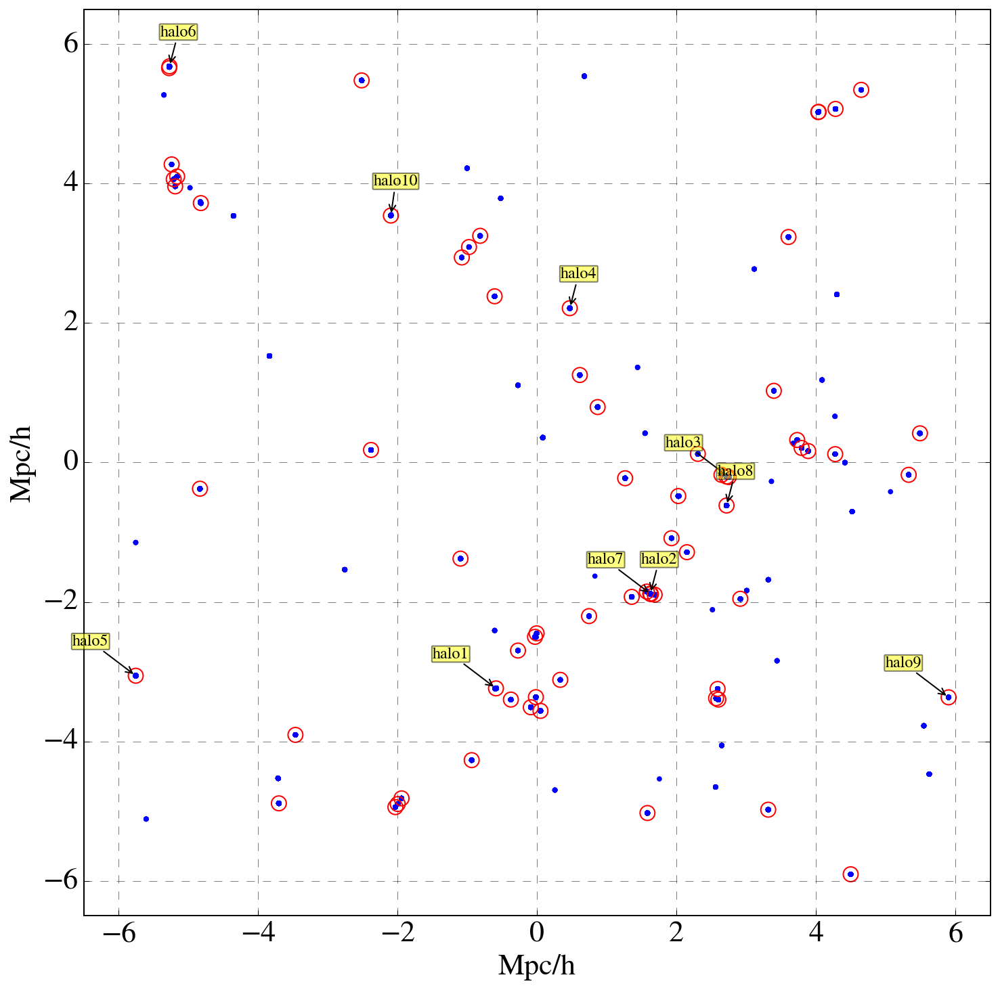

5

In [17]:
# COORDINATES ARE COMOVING MPC / H
fig, ax = plt.subplots(1, 1, figsize=(12,12))

labels = ['halo{0}'.format(i+1) for i in range(len(halosPos))]
plt.scatter(locs[:,0],locs[:,1],s=15,c='b', edgecolors='none') # Plot star particles
plt.scatter(halosPos[:,0],halosPos[:,1],s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='k', linestyle='--',alpha=0.5)
plt.xlabel('Mpc/h')
plt.ylabel('Mpc/h')
plt.xlim([-6.5,6.5])
plt.ylim([-6.5,6.5])
# plt.title('z=%.1lf stars & halo finder'%z)
sign = 1
for label, x, y in zip(labels, halosPos[:,0][:10],halosPos[:,1][:10]):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (-20 * sign, 20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=12,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    sign *= -1
plt.savefig(prefix+"starsAndHalos_{}.pdf".format(z),dpi=fig.dpi,bbox_inches='tight')
plt.show()
gc.collect()
 

## Generate a sampling of galaxy plots

arc sec/kpc = 0.019
********************** Halo 0 **********************
Stellar mass in view 0 is 9.98e+06 solMass
radius 6.48
Stellar mass in halo 0 is 9.91e+06 solMass
********************** Halo 1 **********************
Stellar mass in view 1 is 1.07e+07 solMass
radius 6.63
Stellar mass in halo 1 is 8.66e+06 solMass
********************** Halo 2 **********************
Stellar mass in view 2 is 2.95e+06 solMass
radius 4.32
Stellar mass in halo 2 is 2.94e+06 solMass
********************** Halo 68 **********************
Stellar mass in view 68 is 6.60e+04 solMass
radius 1.22
Stellar mass in halo 68 is 6.60e+04 solMass
********************** Halo 69 **********************
Stellar mass in view 69 is 4.13e+04 solMass
radius 1.04
Stellar mass in halo 69 is 4.13e+04 solMass
********************** Halo 70 **********************
Stellar mass in view 70 is 4.13e+04 solMass
radius 1.04
Stellar mass in halo 70 is 4.13e+04 solMass


12850

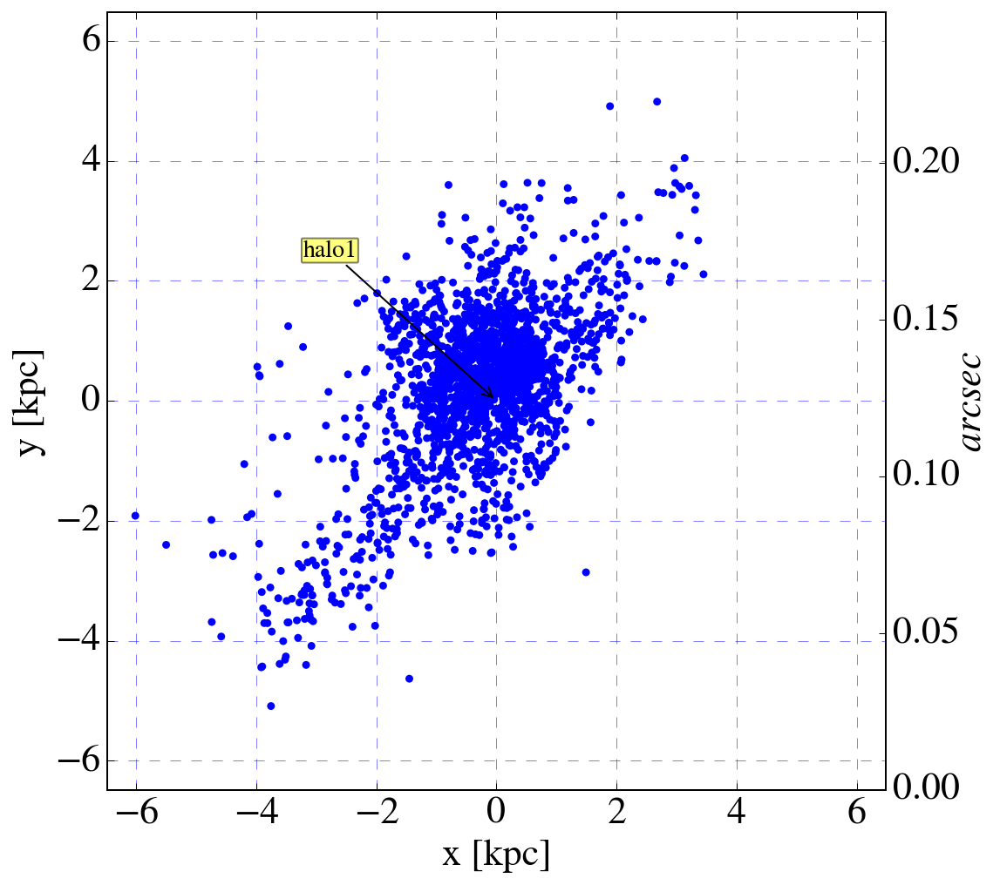

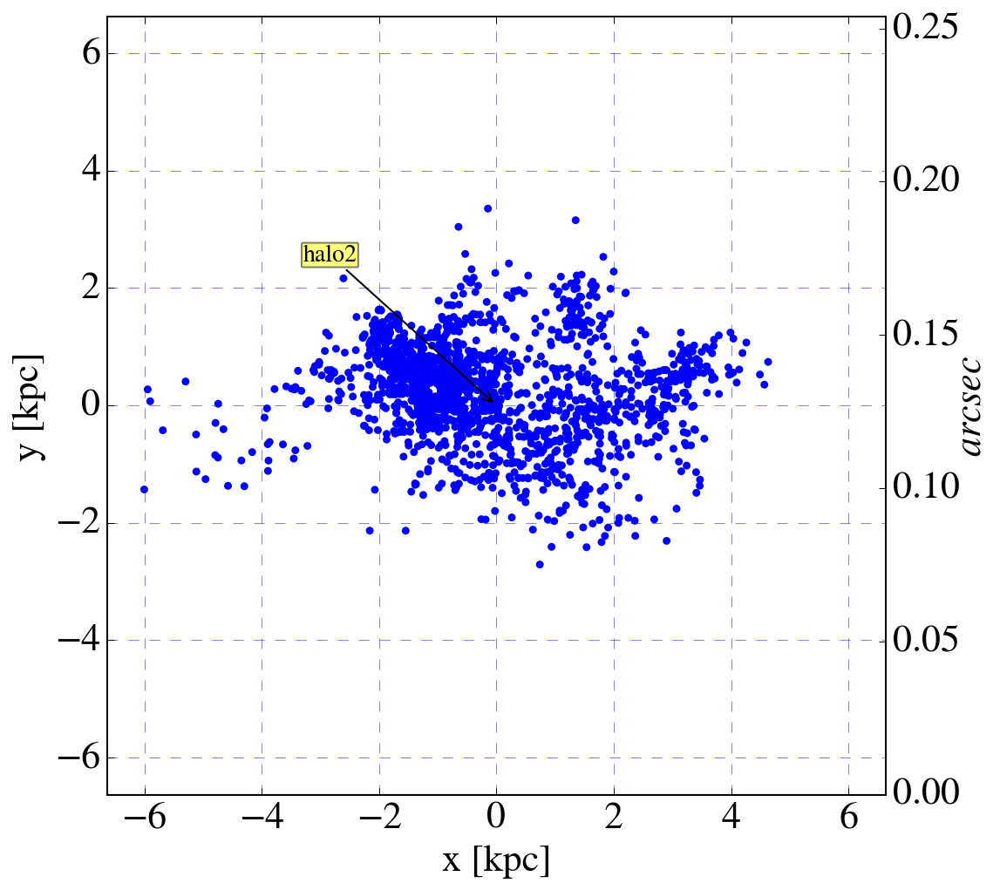

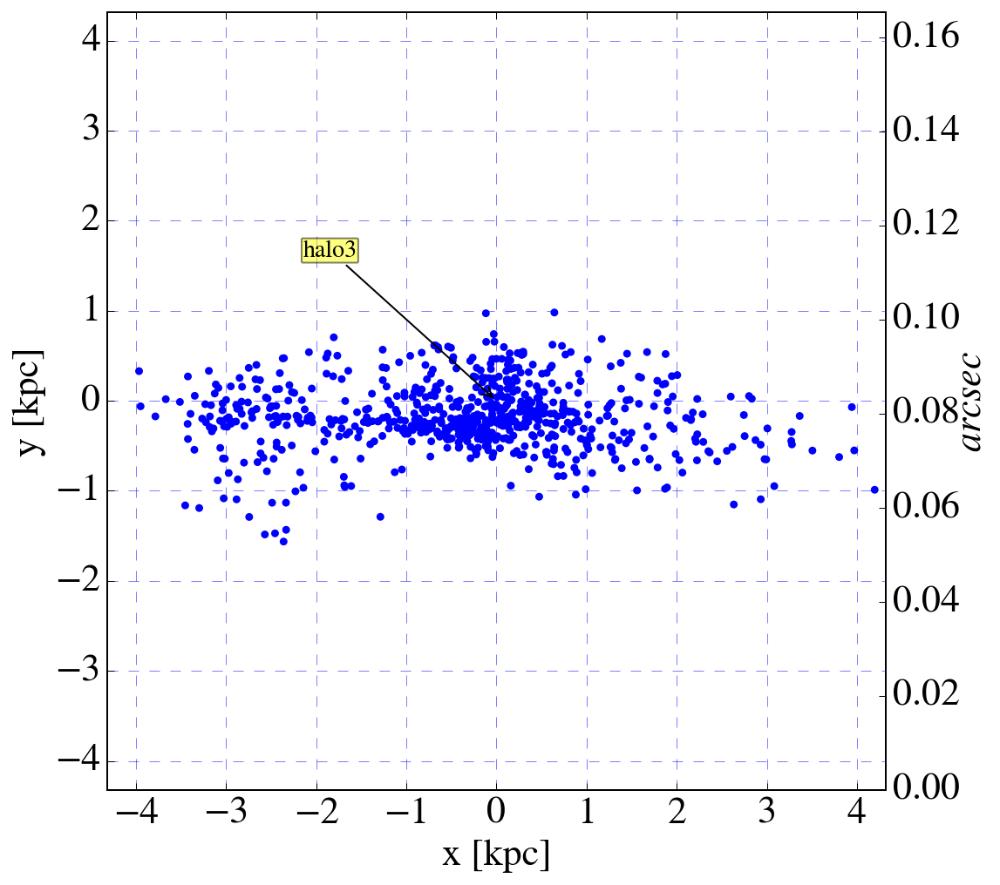

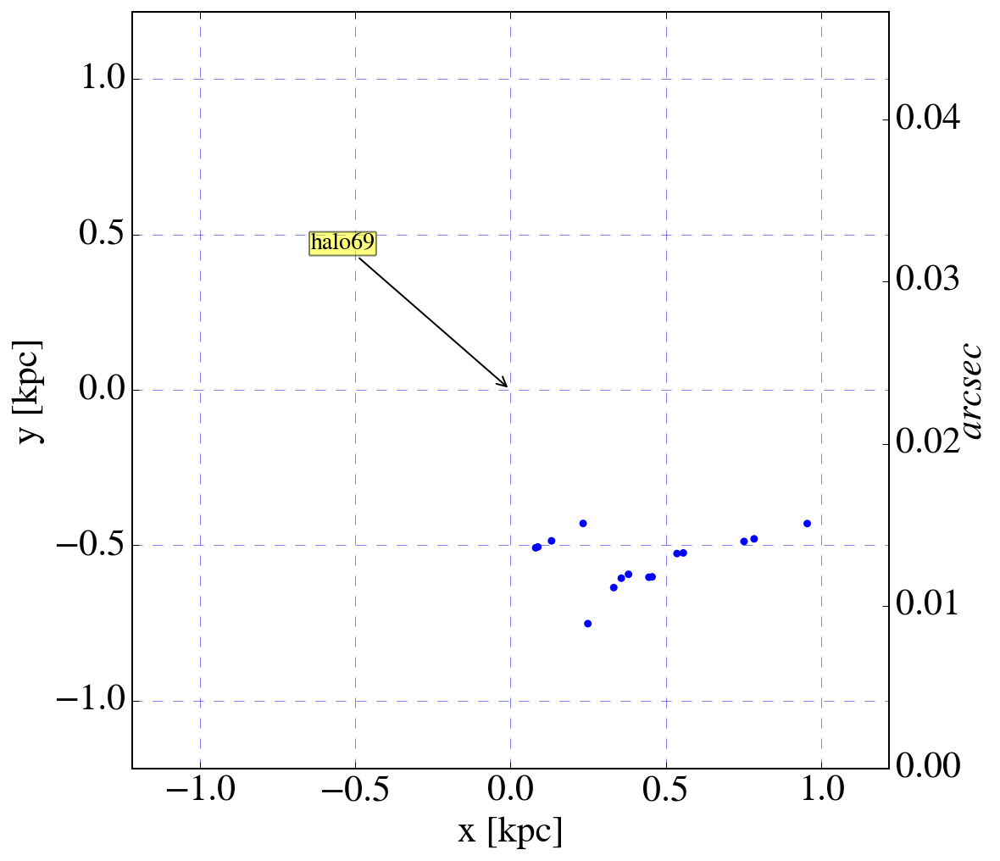

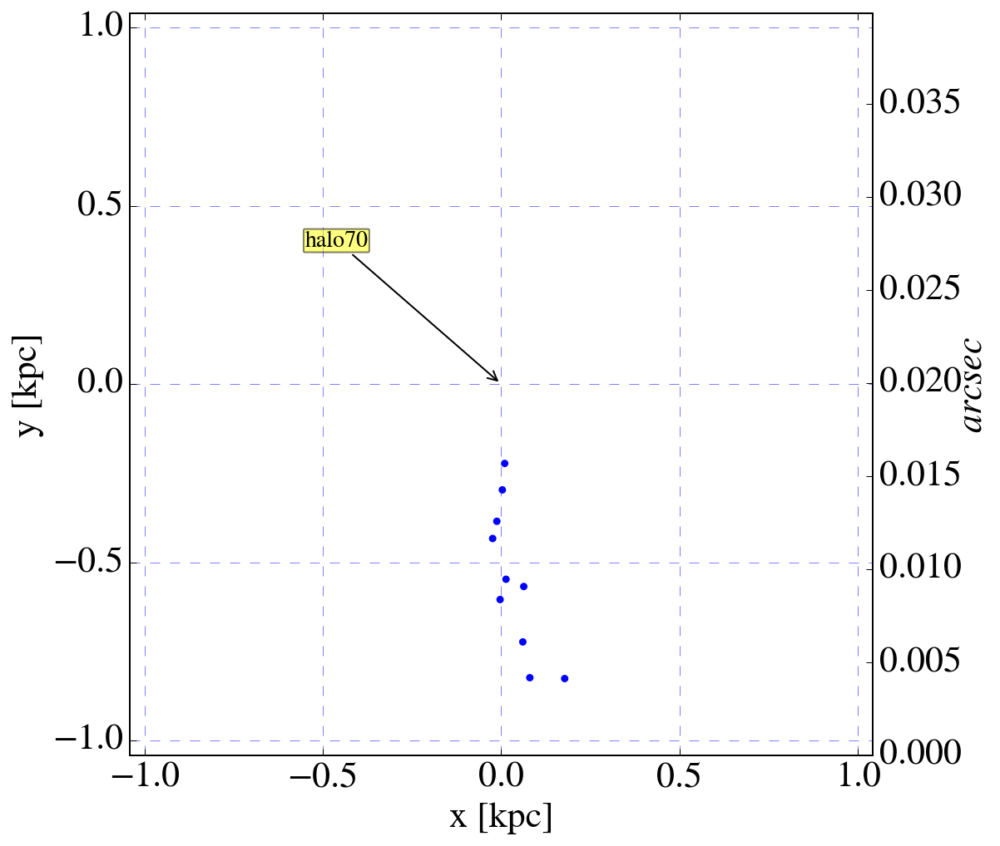

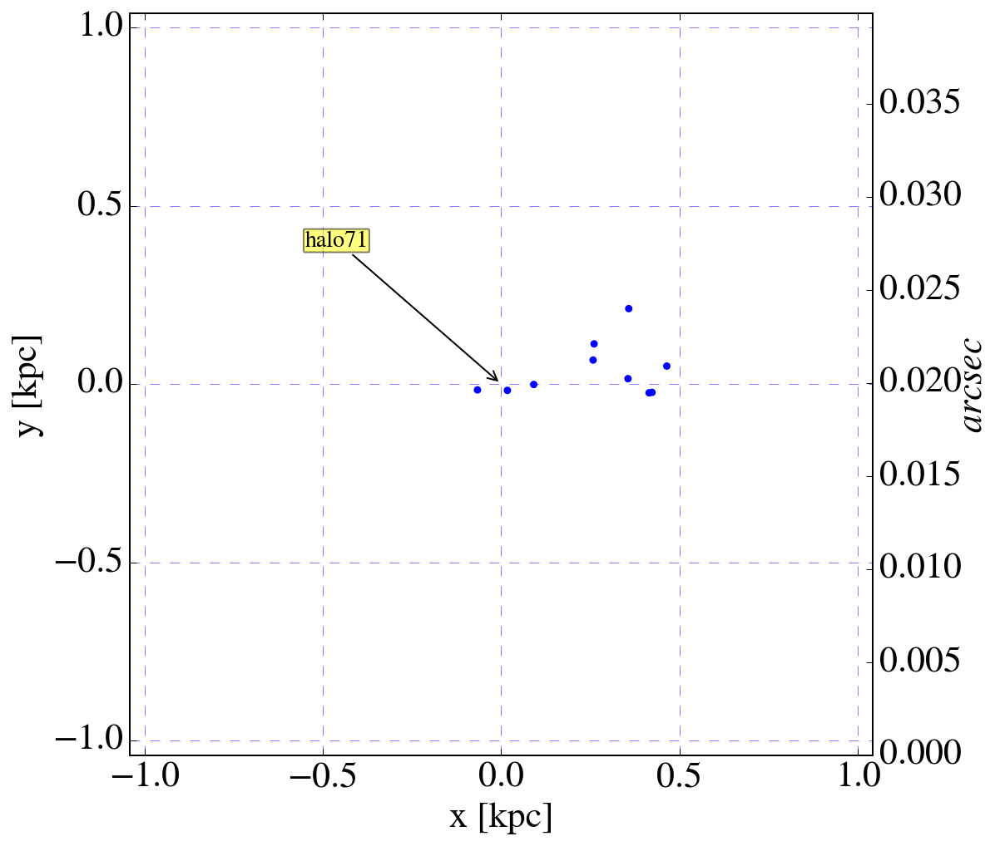

In [18]:
arcSec_per_kpc_comov = myCosmo.arcsec_per_kpc_comoving(z=z).value 
print("arc sec/kpc = {:.3f}".format(arcSec_per_kpc_comov))
radiusScaleFac = 0.75
for halo in chain(range(3),range(len(halosRawPos))[-3:]) :
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    print("********************** Halo {} **********************".format(halo))
    # Get the stars in view so we can compute a virius radius based on star particle mass
    viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = \
                halos.getViewStars(locs * 1000.0, mass,spAges,Z,PZ,PPF,halosPos[halo] * 1000.0, fov=20.0)
    totMass = np.sum(viewhalomass) * u.solMass
    print("Stellar mass in view {} is {:.2e}".format(halo,totMass))
    radius = ((totMass * 3.0/(4.0 * ma.pi) * \
               1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
    radius = radius.value * radiusScaleFac
    print('radius {:.2f}'.format(radius))

    # Pass locs and halosPos in kpc... 
    haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                          halosPos[halo] * 1000.0,radius)

    print("Stellar mass in halo {} is {:.2e}".format(halo, np.sum(halomass * u.solMass)))
    
    ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs
    ax.annotate(
        'halo{0}'.format(halo+1), 
        xy = (0, 0), xytext = (-80, 80),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=14,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim([-radius,radius])
    ax.set_ylim([-radius,radius])
    hax2 = ax.twinx()
    hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
    hax2.set_ylabel(r'$arcsec$')
    hax2.yaxis.labelpad = -3
#     plt.savefig('/Users/earnric/Desktop/SP-galaxy_z_{}_{}.png'.format(z,halo),dpi=fig.dpi,bbox_inches='tight')
    del ax
gc.collect()

arc sec/kpc = 0.019
********************** Halo 0 **********************
Stellar mass in view 0 is 9.98e+06 solMass
radius 12.97
Stellar mass in halo 0 is 9.99e+06 solMass
********************** Halo 1 **********************
Stellar mass in view 1 is 1.07e+07 solMass
radius 13.26
Stellar mass in halo 1 is 1.07e+07 solMass
********************** Halo 2 **********************
Stellar mass in view 2 is 2.95e+06 solMass
radius 8.64
Stellar mass in halo 2 is 2.95e+06 solMass


604

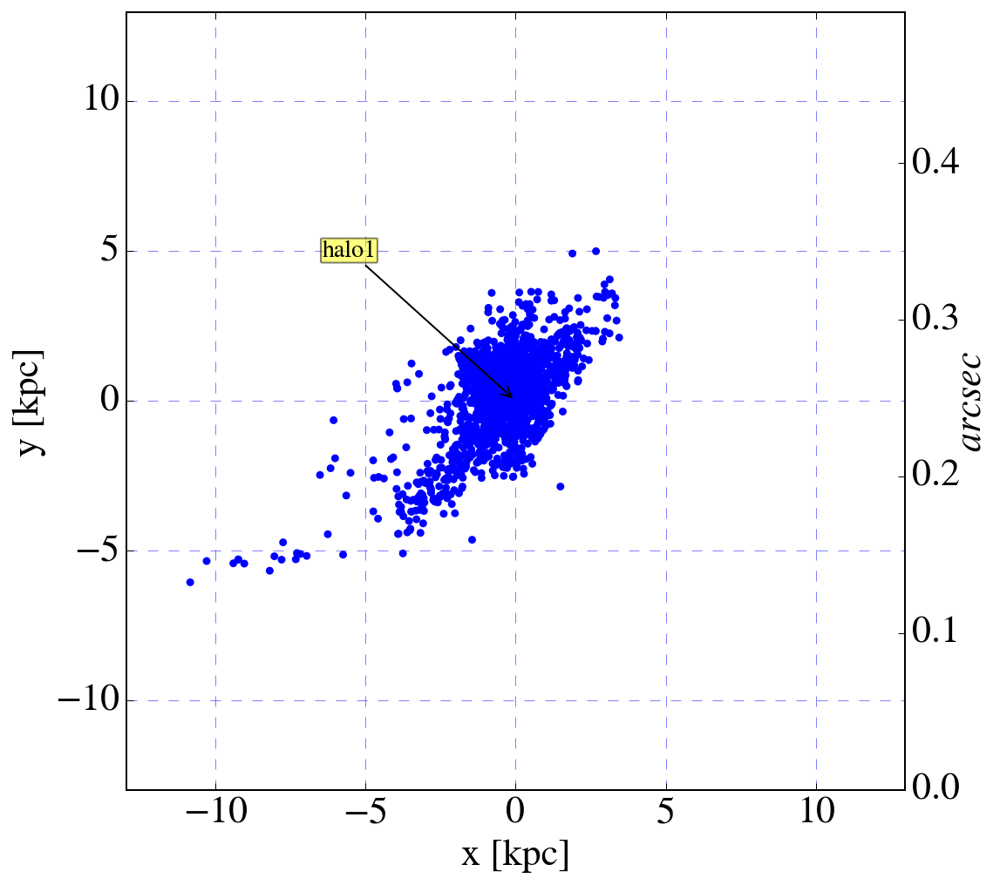

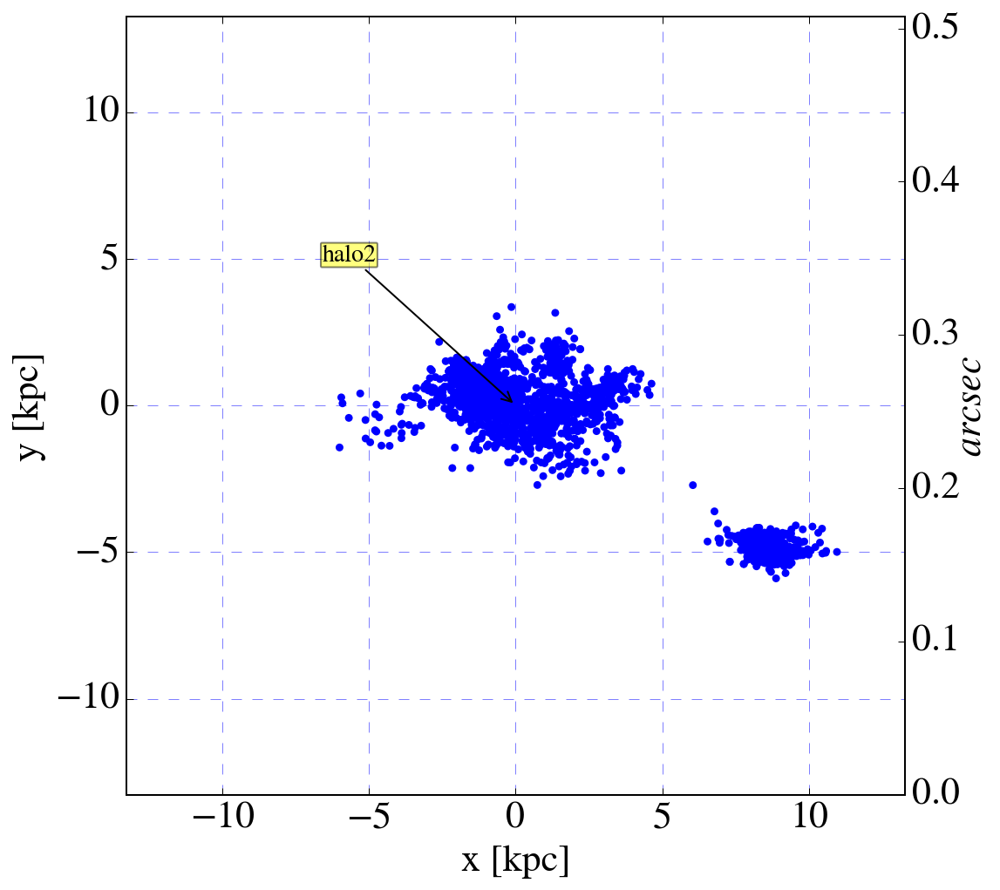

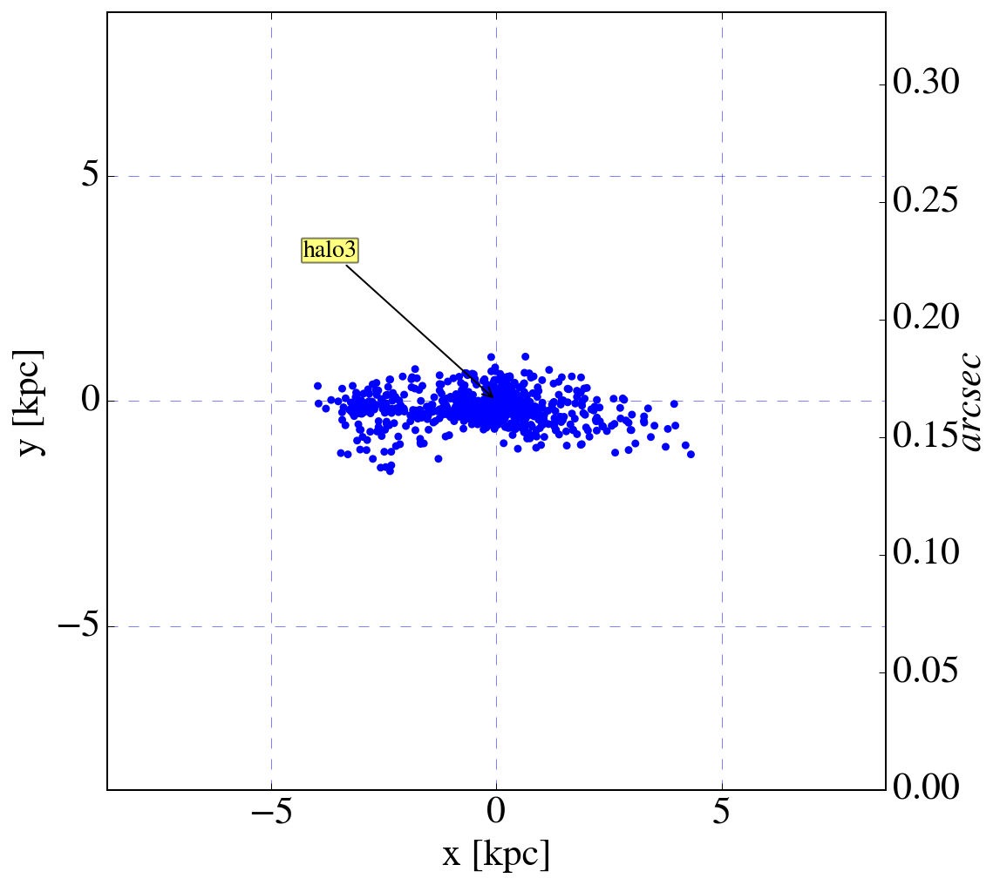

In [19]:
arcSec_per_kpc_comov = myCosmo.arcsec_per_kpc_comoving(z=z).value 
print("arc sec/kpc = {:.3f}".format(arcSec_per_kpc_comov))
radiusScaleFac = 1.50
for halo in range(3) :
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    print("********************** Halo {} **********************".format(halo))
    # Get the stars in view so we can compute a virius radius based on star particle mass
    viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = \
                halos.getViewStars(locs * 1000.0, mass,spAges,Z,PZ,PPF,halosPos[halo] * 1000.0, fov=20.0)
    totMass = np.sum(viewhalomass) * u.solMass
    print("Stellar mass in view {} is {:.2e}".format(halo,totMass))
    radius = ((totMass * 3.0/(4.0 * ma.pi) * \
               1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
    radius = radius.value * radiusScaleFac
    print('radius {:.2f}'.format(radius))

    # Pass locs and halosPos in kpc... 
    haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                          halosPos[halo] * 1000.0,radius)

    print("Stellar mass in halo {} is {:.2e}".format(halo, np.sum(halomass * u.solMass)))
    
    ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs
    ax.annotate(
        'halo{0}'.format(halo+1), 
        xy = (0, 0), xytext = (-80, 80),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=14,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim([-radius,radius])
    ax.set_ylim([-radius,radius])
    hax2 = ax.twinx()
    hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
    hax2.set_ylabel(r'$arcsec$')
    hax2.yaxis.labelpad = -3
#     plt.savefig('/Users/earnric/Desktop/SP-galaxy_z_{}_{}.png'.format(z,halo),dpi=fig.dpi,bbox_inches='tight')
    del ax
gc.collect()

# Check not-found halos...

This is a manual procedure... Refine x/y lims around area of interest.
* Next look generate a pltview around those coords to find the stars in that 2D view.
* Extract the z-coord from those stars.
* Get a mass in stars: compute an appropriate r_v.
* Get those halo stars and plot

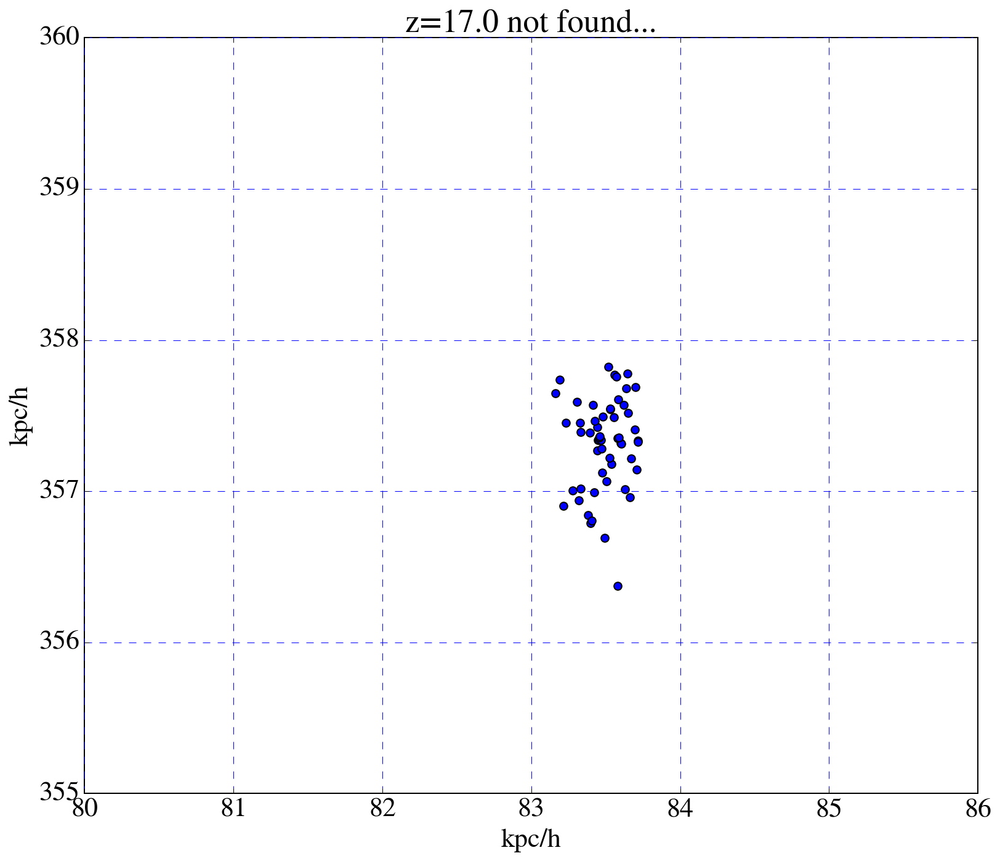

4018

In [21]:
htp = len(halosRawPos)
labels = ['halo{0}'.format(i) for i in range(len(halosPos))]
plt.scatter(locs[:,0]*1000,locs[:,1]*1000,s=40,c='b') # Plot star particles
plt.scatter(halosPos[:htp,0]*1000,halosPos[:htp,1]*1000,s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='b', linestyle='--')
plt.xlabel('kpc/h')
plt.ylabel('kpc/h')
plt.xlim([80.0,86.0])
plt.ylim([355.0,360.0])

plt.title('z=%.1lf not found...'%z)

plt.show()
gc.collect()
 

In [22]:
# Determine the z coordiante ... use a view that looks through the entire vol
viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = halos.getViewStars(locs * 1000.0,mass,spAges,
                                                                                        Z,PZ,PPF,[83.5,357.0,0.0])

In [23]:
# Get z coord, compute mass of stars... 
viewhaloStars[0],np.sum(viewhalomass)

(array([ -5.49745236e-02,   2.67943263e-01,   3.51693762e+03]),
 220424.9800548676)

In [24]:
viewhaloZ

array([  5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
         5.00000000e-09,   5.00000000e-09,   1.60107979e-04,
         1.68822813e-04,   2.41237269e-04,   3.34894269e-04,
         3.47665902e-04,   4.28100195e-04,   3.62420523e-04,
         6.86416394e-04,

In [25]:
radiusScaleFac = 0.75
radius = ((np.sum(viewhalomass) * u.solMass * 3.0/(4.0 * ma.pi) * \
           1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
radius = radius.value * radiusScaleFac
radius

1.819170831178755

Halo mass 2 is 2.20e+05


6602

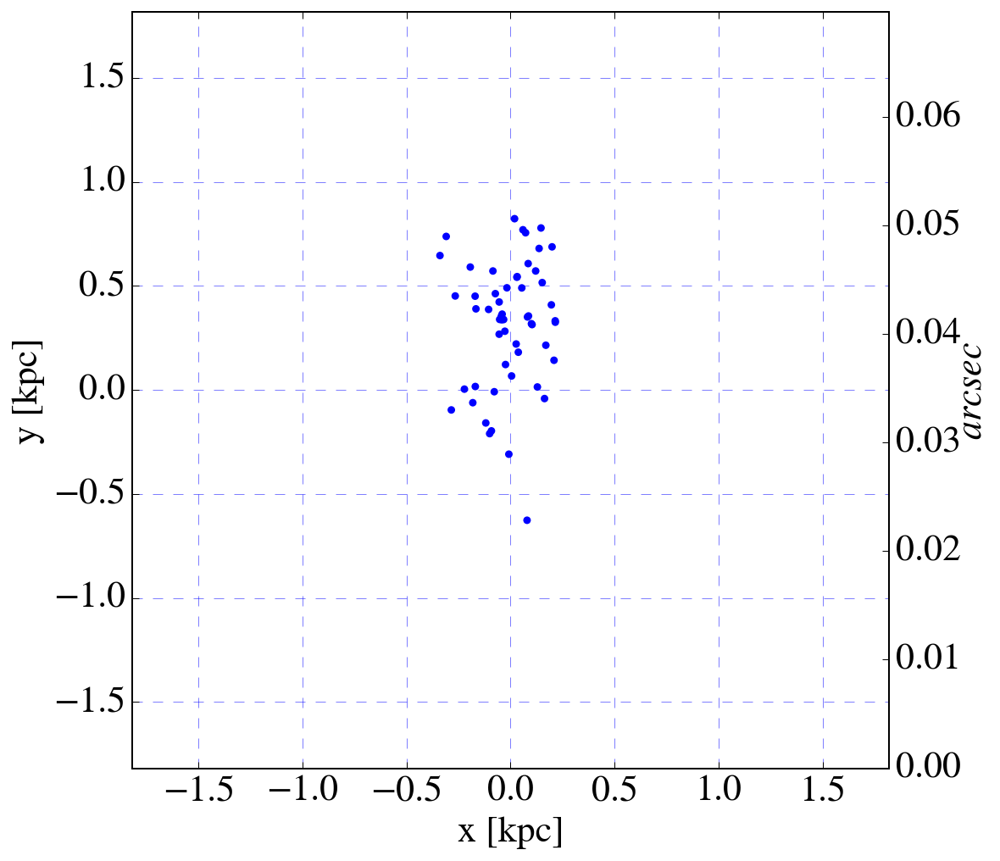

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
# Pass locs and halosPos in kpc... 
# radius = 3.0
haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                      [83.5,357.0,3517],radius)

print("Halo mass {} is {:.2e}".format(halo, np.sum(halomass)))

ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs

ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
ax.set_xlabel('x [kpc]')
ax.set_ylabel('y [kpc]')
ax.set_xlim([-radius,radius])
ax.set_ylim([-radius,radius])
hax2 = ax.twinx()
hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
hax2.set_ylabel(r'$arcsec$')
hax2.yaxis.labelpad = -3
del ax
gc.collect()

# Process z=16, output_00021

In [27]:
# Make sure we have halo information for this z... hop/...
num = 21 # This is the output_00num file that has the "info_" for finding the boxsize... see map above.
z   = 16.0

prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
infoSize = lsp.getBoxSize(num,prefix) ### REMEMBER to Load from info_xxxx ###
print("Using info size, astro convert = {:.3f}".format((infoSize * u.cm).to(u.kpc)) )
boxsizekpc = (infoSize * u.cm).to(u.kpc).value

rho_critDMz = myCosmo.critical_density(z) * myCosmo.Odm(z) # rho_crit @ z for DM only
print('$rho_crit,dm,{:.1f}$ = {:.3e}'.format(z,rho_critDMz))

gc.collect()

Using info size, astro convert = 992.377 kpc
$rho_crit,dm,16.0$ = 1.033e-26 g / cm3


4420

In [28]:
locsRaw, mass, bt, Z, PZ, PPF = lsp.loadSP(z)
##############################################
# Need to correct the Z and PZ for the pristine
# fraction of the SP... 
##############################################
fpol = 1.0-PPF
fpol[fpol < 1e-5] = 0.0 # Don't form polluted stars when fpol is very small

Z_corr = Z/fpol
Z_corr[np.isinf(Z_corr)] = 0.9e-5 # Make the Z of the particles < Z_crit (1e-5)
Z_corr[Z_corr < 1e-5]    = 0.9e-5 # Place them all just below Z_crit
gc.collect()
locsRaw.size

/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: RuntimeWarning: divide by zero encountered in true_divide


94599

In [29]:
# Convert to comoving Mpc ... 
locs = (locsRaw/boxsizekpc) * comovingBox

In [30]:
# Compute age of the star particles...
# spAges is in Myr ... 

baseAge = cosmo.ageAtz(71,z) # ageAtZ return Myr, parameters are H and z
print("My code - Age at z={} is {:.2f} Myr".format(z,baseAge))
spAges = baseAge - bt/1e6    # bt from SP file is in yr, convert to Myr... 
print("Star particle age range {:.2f} Myr - {:.2f} Myr".format(min(spAges),max(spAges)))
print("Star particle Z range   {:.3e} Solar - {:.4f} Solar".format(min(Z),max(Z)))

My code - Age at z=16.0 is 253.64 Myr
Star particle age range 1.03 Myr - 101.10 Myr
Star particle Z range   5.000e-09 Solar - 0.2316 Solar


In [31]:
arcPerKpcC = myCosmo.arcsec_per_kpc_comoving(z=z)
print('AstroPy - Comoving @ {}, {:.4f}'.format(z,arcPerKpcC))
arcPerKpcP = myCosmo.arcsec_per_kpc_proper(z=z)
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,arcPerKpcP))
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,1/arcPerKpcP))

kpcPerArcSec = cosmo.arcAtz(71,z=z,om=0.267) # size of an arcsec at the specified reshift in kpc
print('My code - Comoving @ {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec/(1+z)))
print('My code -  Proper @  {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec))
print('My code -  Proper @  {}, {:.4f} kpc / arcsec'.format(z,kpcPerArcSec))

AstroPy - Comoving @ 16.0, 0.0194 arcsec / kpc
AstroPy -  Proper @  16.0, 0.3290 arcsec / kpc
AstroPy -  Proper @  16.0, 3.0399 kpc / arcsec
My code - Comoving @ 16.0, 0.0192 arcsec / kpc
My code -  Proper @  16.0, 0.3271 arcsec / kpc
My code -  Proper @  16.0, 3.0574 kpc / arcsec


In [32]:
myCosmo.age(z)

<Quantity 0.25165109687465154 Gyr>

In [33]:
##
## Load the halo locations
## hop halo pos file key:    #   npart,mass,cont.frac,xc,yc,zc,uc,vc,wc
## Scale locations to co-moving coordates

## THESE HALOS ARE BASED ON STAR PARTICLE LOCATIONS ##
##
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/12Mpc-n.48-eps20-output/'
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
halosRawPos = lsp.loadHaloGrps(num,prefix=prefix+'hopStarData/') # Returns positions normalized to (-0.5, 0.5)
halossizes = lsp.loadHaloSizes(num,prefix=prefix+'hopStarData/') # Returns positions normalized to (-0.5, 0.5)
# halosRawPos = lsp.loadHaloGrps(num) # Returns positions normalized to (-0.5, 0.5)
# halossizes = lsp.loadHaloSizes(num) # Returns positions normalized to (-0.5, 0.5)

#halosPos = halosRawPos * boxsizekpc
halosPos = halosRawPos * comovingBox  # Comoving box 
print("Num of halos @ {} = {}".format(z,len(halosRawPos)))

Num of halos @ 16.0 = 162


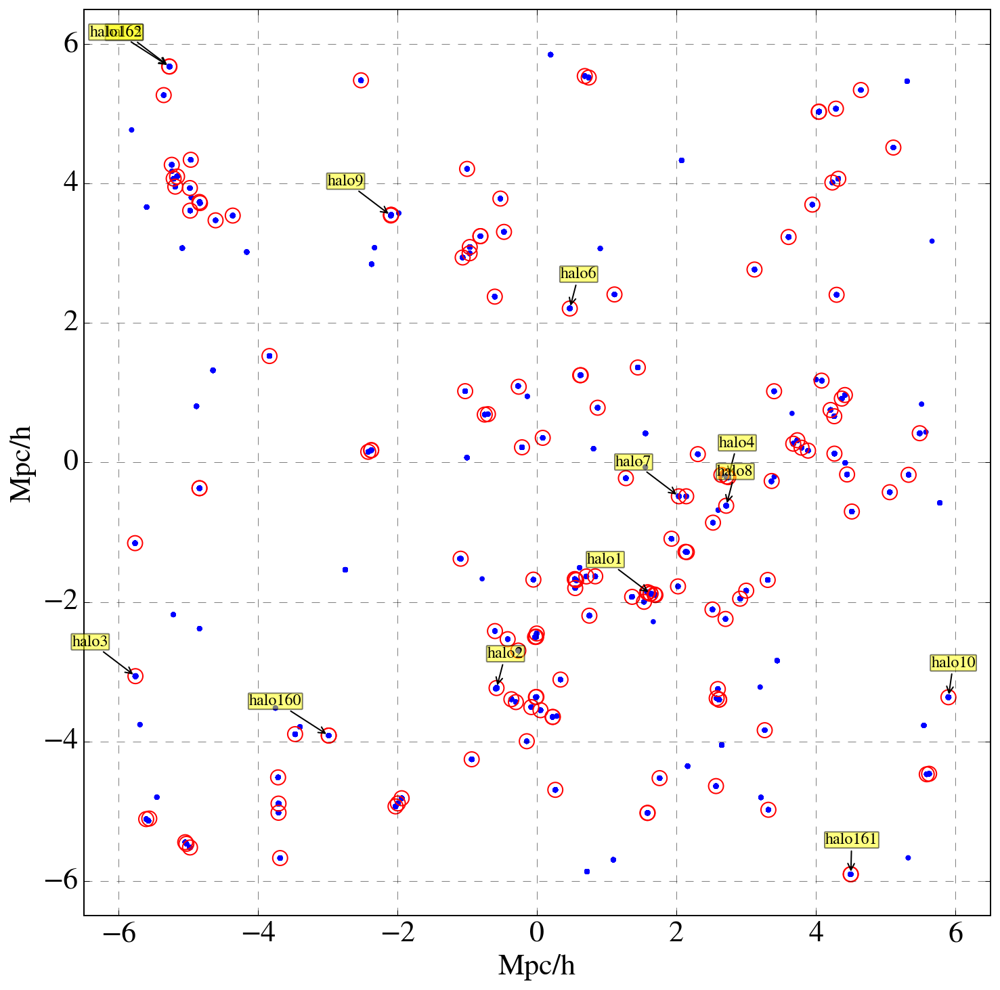

5697

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(12,12))
# COORDINATES ARE COMOVING MPC / H
labels = ['halo{0}'.format(i+1) for i in range(len(halosPos))]
plt.scatter(locs[:,0],locs[:,1],s=15,c='b', edgecolors='none') # Plot star particles
plt.scatter(halosPos[:,0],halosPos[:,1],s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='k', linestyle='--',alpha=0.5)
plt.xlabel('Mpc/h')
plt.ylabel('Mpc/h')
plt.xlim([-6.5,6.5])
plt.ylim([-6.5,6.5])
# plt.title('z=%.1lf stars & halo finder'%z)
sign = 1
for label, x, y in zip(chain(labels[:10],labels[-3:]), 
                       chain(halosPos[:,0][:10],halosPos[:,0][-3:]),
                       chain(halosPos[:,1][:10],halosPos[:,1][-3:])):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (-20 * sign, 20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=12,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    sign *= -1
plt.savefig(prefix+"starsAndHalos_{}.pdf".format(z),dpi=fig.dpi,bbox_inches='tight')
plt.show()
gc.collect()
 

arc sec/kpc = 0.019
********************** Halo 0 **********************
Stellar mass in view 0 is 1.77e+07 solMass
radius 15.65
Stellar mass in halo 0 is 1.77e+07 solMass
********************** Halo 1 **********************
Stellar mass in view 1 is 1.43e+07 solMass
radius 14.58
Stellar mass in halo 1 is 1.43e+07 solMass
********************** Halo 2 **********************
Stellar mass in view 2 is 3.37e+06 solMass
radius 9.00
Stellar mass in halo 2 is 3.37e+06 solMass
********************** Halo 159 **********************
Stellar mass in view 159 is 2.98e+05 solMass
radius 4.01
Stellar mass in halo 159 is 2.98e+05 solMass
********************** Halo 160 **********************
Stellar mass in view 160 is 8.10e+05 solMass
radius 5.59
Stellar mass in halo 160 is 7.54e+05 solMass
********************** Halo 161 **********************
Stellar mass in view 161 is 3.11e+06 solMass
radius 8.77
Stellar mass in halo 161 is 3.04e+06 solMass


788

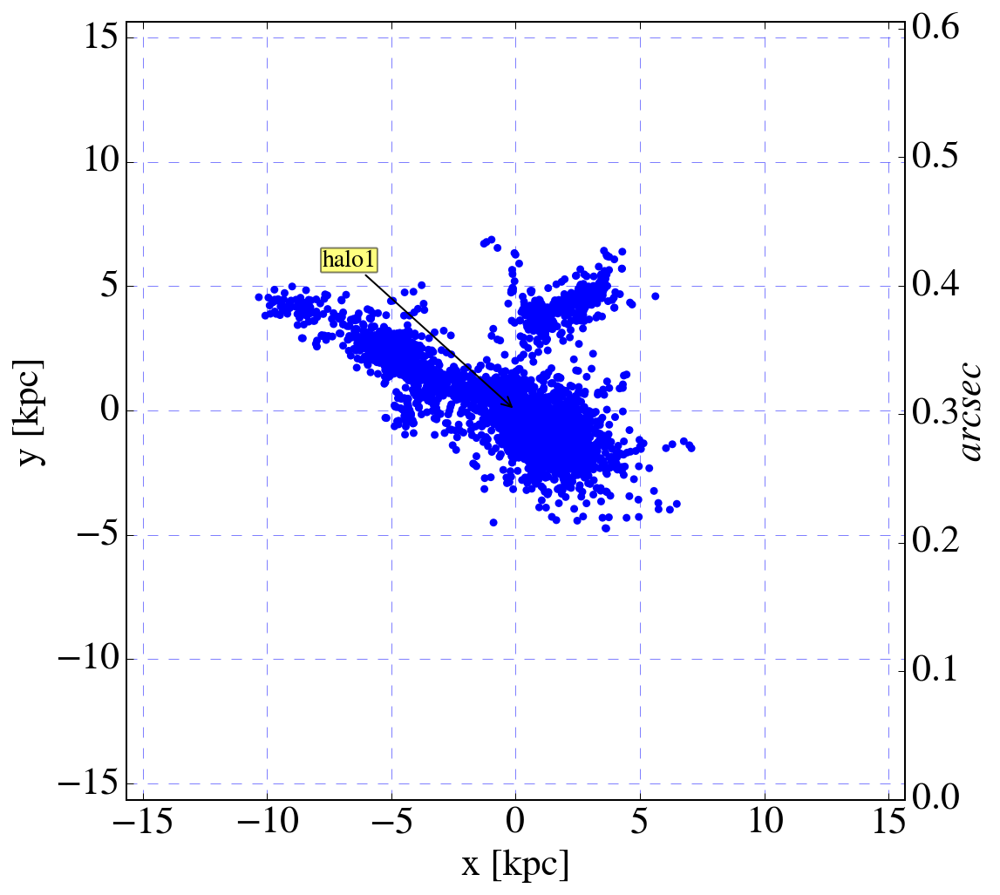

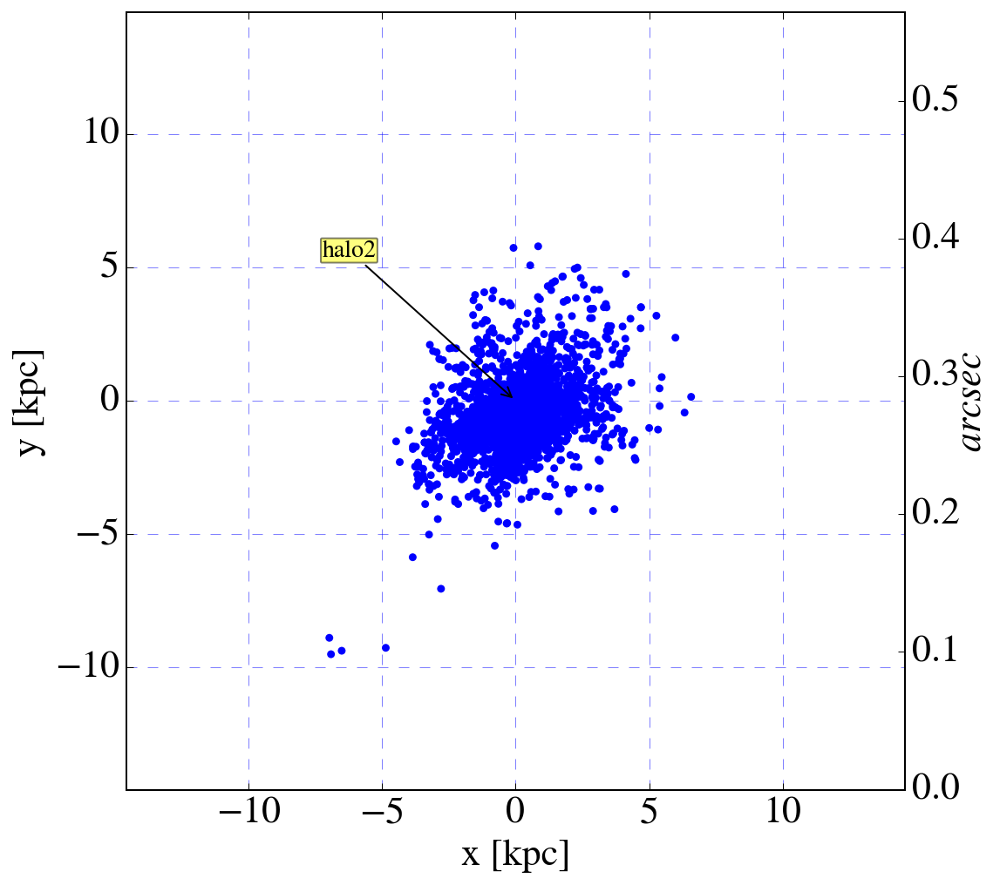

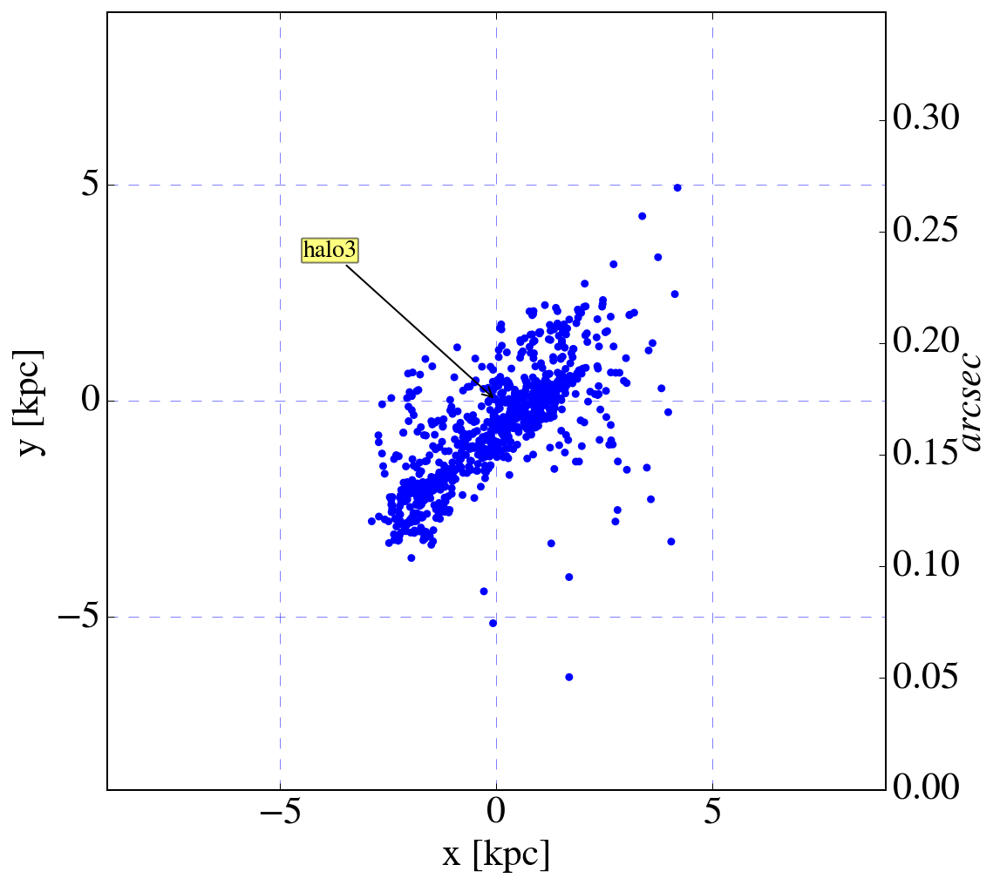

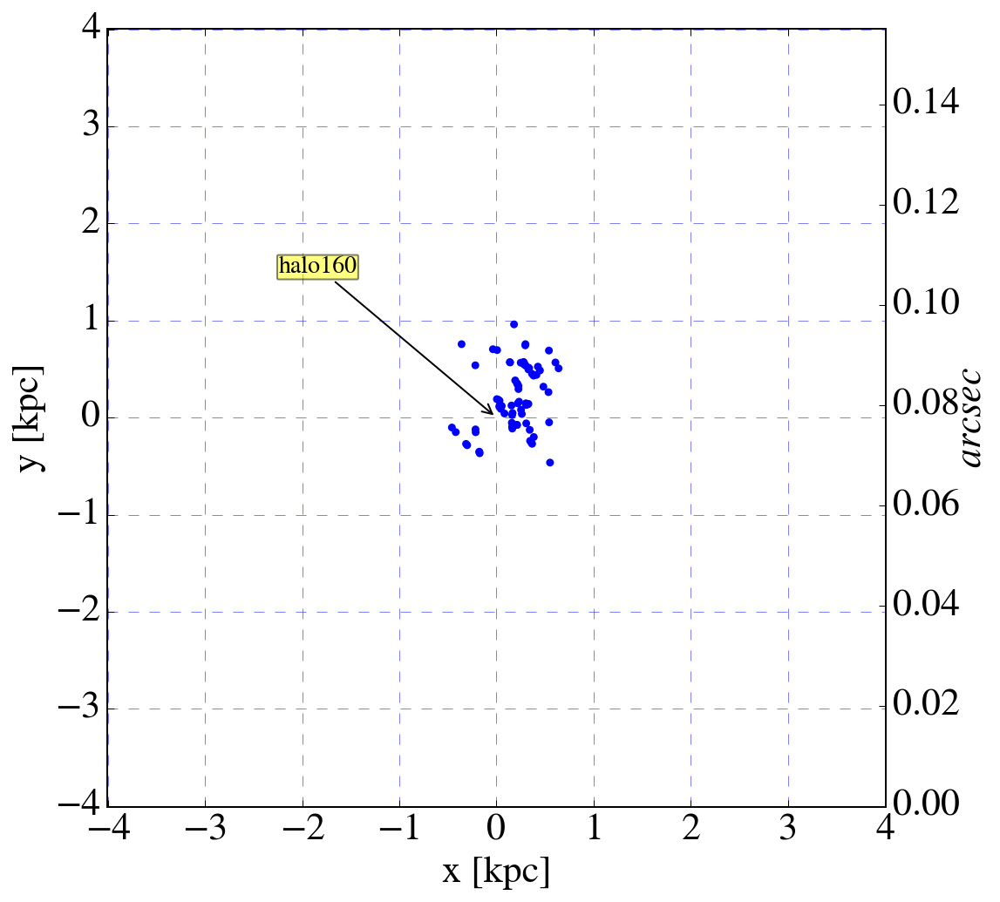

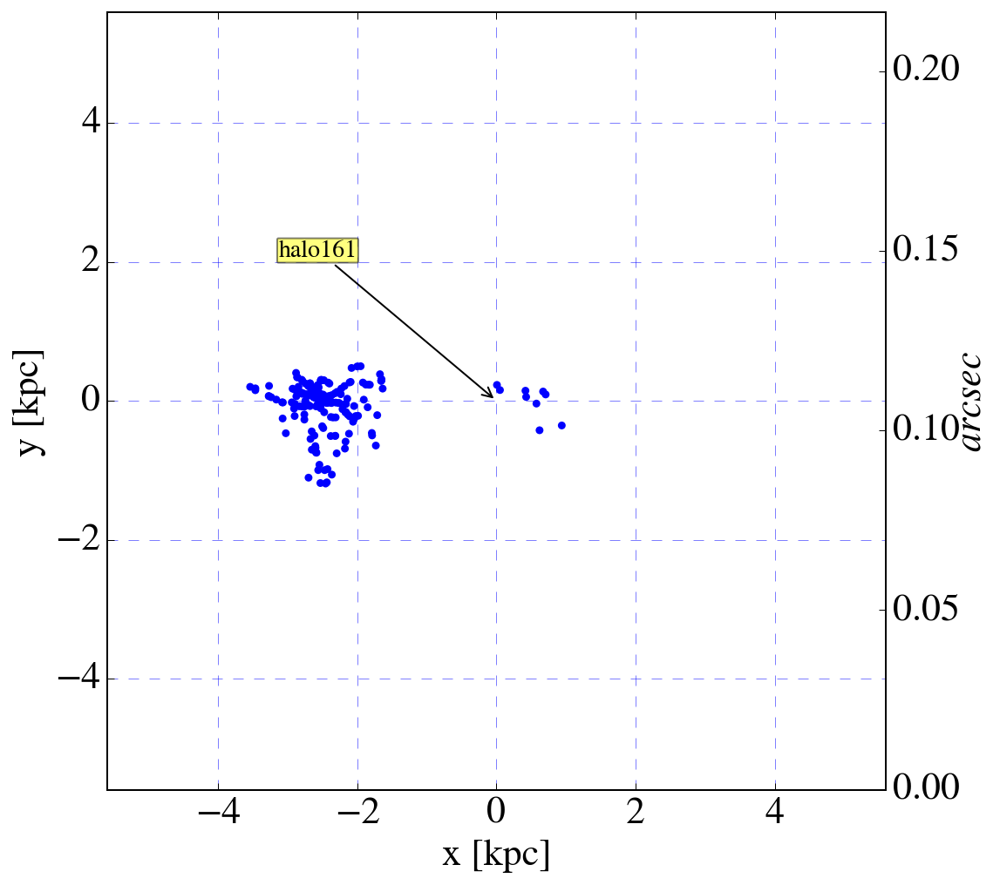

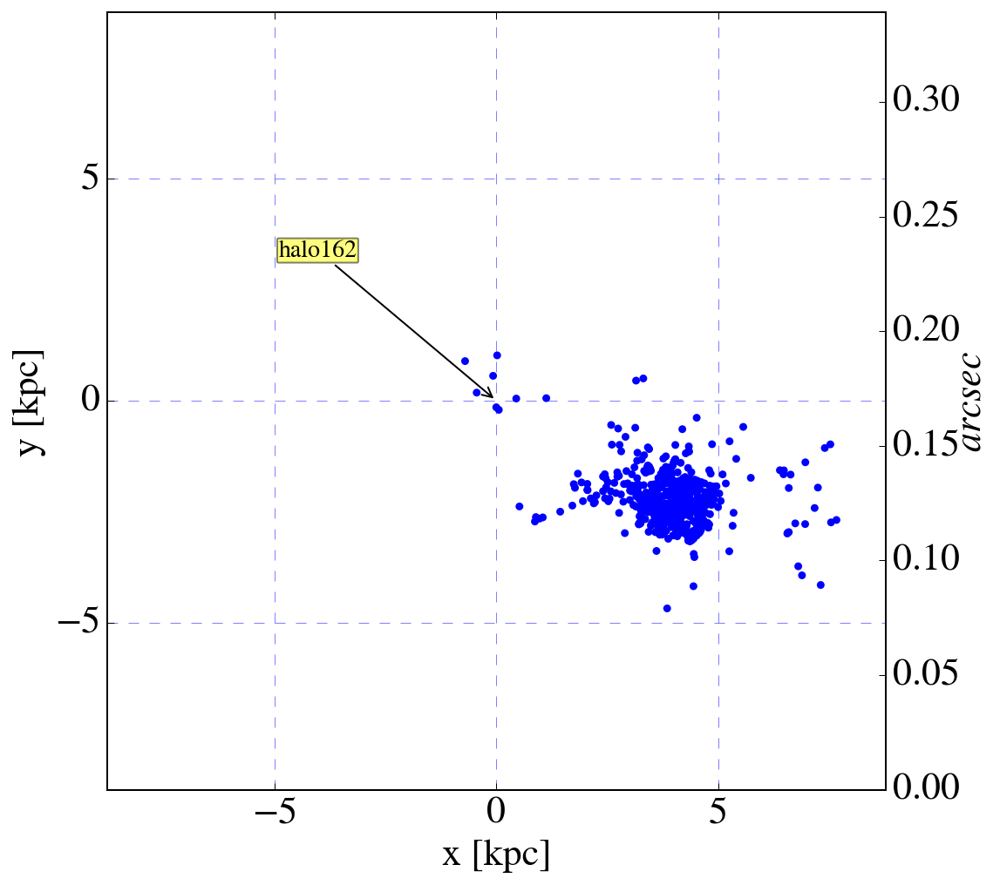

In [37]:
arcSec_per_kpc_comov = myCosmo.arcsec_per_kpc_comoving(z=z).value 
print("arc sec/kpc = {:.3f}".format(arcSec_per_kpc_comov))
radiusScaleFac = 1.5
for halo in chain(range(3),range(len(halosRawPos))[-3:]) :
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    print("********************** Halo {} **********************".format(halo))
    # Get the stars in view so we can compute a virius radius based on star particle mass
    viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = \
                halos.getViewStars(locs * 1000.0, mass,spAges,Z,PZ,PPF,halosPos[halo] * 1000.0, fov=20.0)
    totMass = np.sum(viewhalomass) * u.solMass
    print("Stellar mass in view {} is {:.2e}".format(halo,totMass))
    radius = ((totMass * 3.0/(4.0 * ma.pi) * \
               1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
    radius = radius.value * radiusScaleFac
    print('radius {:.2f}'.format(radius))

    # Pass locs and halosPos in kpc... 
    haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                          halosPos[halo] * 1000.0,radius)

    print("Stellar mass in halo {} is {:.2e}".format(halo, np.sum(halomass * u.solMass)))
    
    ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs
    ax.annotate(
        'halo{0}'.format(halo+1), 
        xy = (0, 0), xytext = (-80, 80),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=14,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim([-radius,radius])
    ax.set_ylim([-radius,radius])
    hax2 = ax.twinx()
    hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
    hax2.set_ylabel(r'$arcsec$')
    hax2.yaxis.labelpad = -3
#     plt.savefig('/Users/earnric/Desktop/SP-galaxy_z_{}_{}.png'.format(z,halo),dpi=fig.dpi,bbox_inches='tight')
    del ax
gc.collect()

# Check not-found halos...

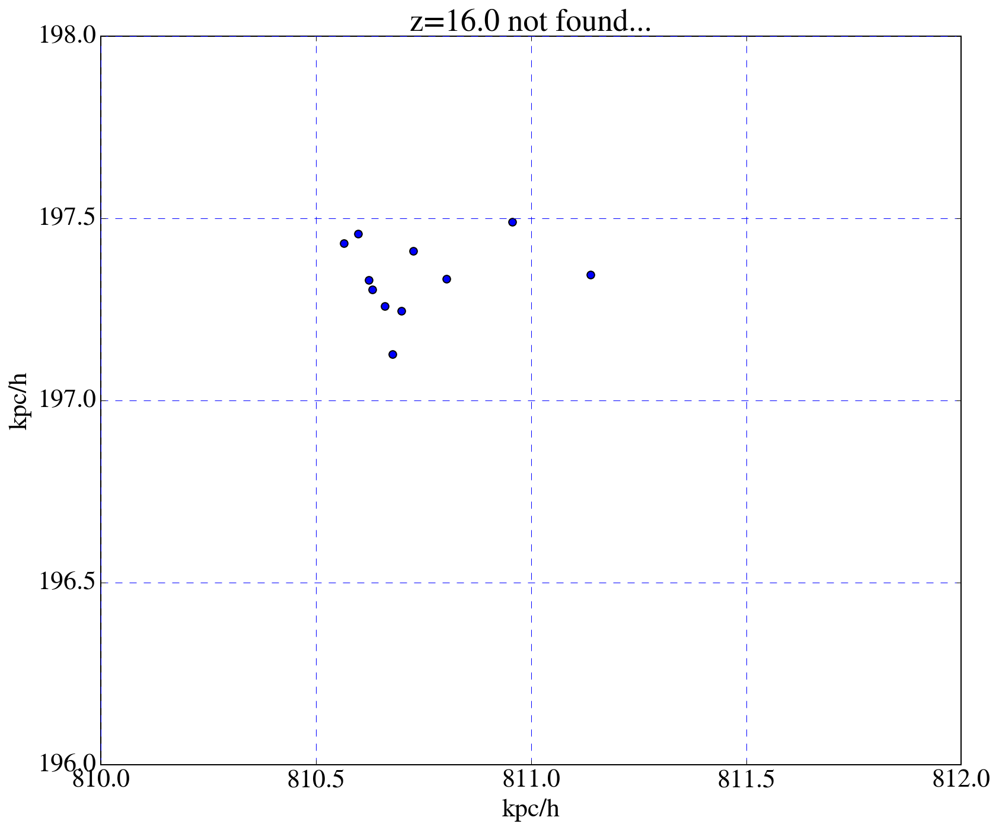

3739

In [42]:
htp = len(halosRawPos)
labels = ['halo{0}'.format(i) for i in range(len(halosPos))]
plt.scatter(locs[:,0]*1000,locs[:,1]*1000,s=40,c='b') # Plot star particles
plt.scatter(halosPos[:htp,0]*1000,halosPos[:htp,1]*1000,s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='b', linestyle='--')
plt.xlabel('kpc/h')
plt.ylabel('kpc/h')
plt.xlim([810.0,812.0])
plt.ylim([196.0,198.0])

plt.title('z=%.1lf not found...'%z)

plt.show()
gc.collect()
 

In [43]:
# Determine the z coordiante ... use a view that looks through the entire vol
viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = halos.getViewStars(locs * 1000.0,mass,spAges,
                                                                                        Z,PZ,PPF,[811,197.0,0.0])

In [44]:
# Get z coord, compute mass of stars... 
viewhaloStars,np.sum(viewhalomass),viewhaloZ

(array([[ -3.21656866e-01,   1.27350729e-01,   2.57458920e+03],
        [ -4.02626778e-01,   4.57635531e-01,   2.57488061e+03],
        [ -3.68534122e-01,   3.05679836e-01,   2.57477474e+03],
        [ -3.77950714e-01,   3.30957682e-01,   2.57480304e+03],
        [ -3.39551491e-01,   2.59426855e-01,   2.57469411e+03],
        [ -3.01216636e-01,   2.45930381e-01,   2.57462085e+03],
        [ -4.35195380e-01,   4.32435268e-01,   2.57462427e+03],
        [ -2.73979266e-01,   4.11159688e-01,   2.57470405e+03],
        [ -1.96746733e-01,   3.33912446e-01,   2.57476646e+03],
        [ -4.43857378e-02,   4.90949066e-01,   2.57446557e+03],
        [  1.38086759e-01,   3.45290414e-01,   2.57479018e+03]]),
 45405.894767856968,
 array([  5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09,   5.00000000e-09]))

In [45]:
radiusScaleFac = 1.5
radius = ((np.sum(viewhalomass) * u.solMass * 3.0/(4.0 * ma.pi) * \
           1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
radius = radius.value * radiusScaleFac
radius

2.1413217777963514

Halo mass 161 is 4.54e+04


12371

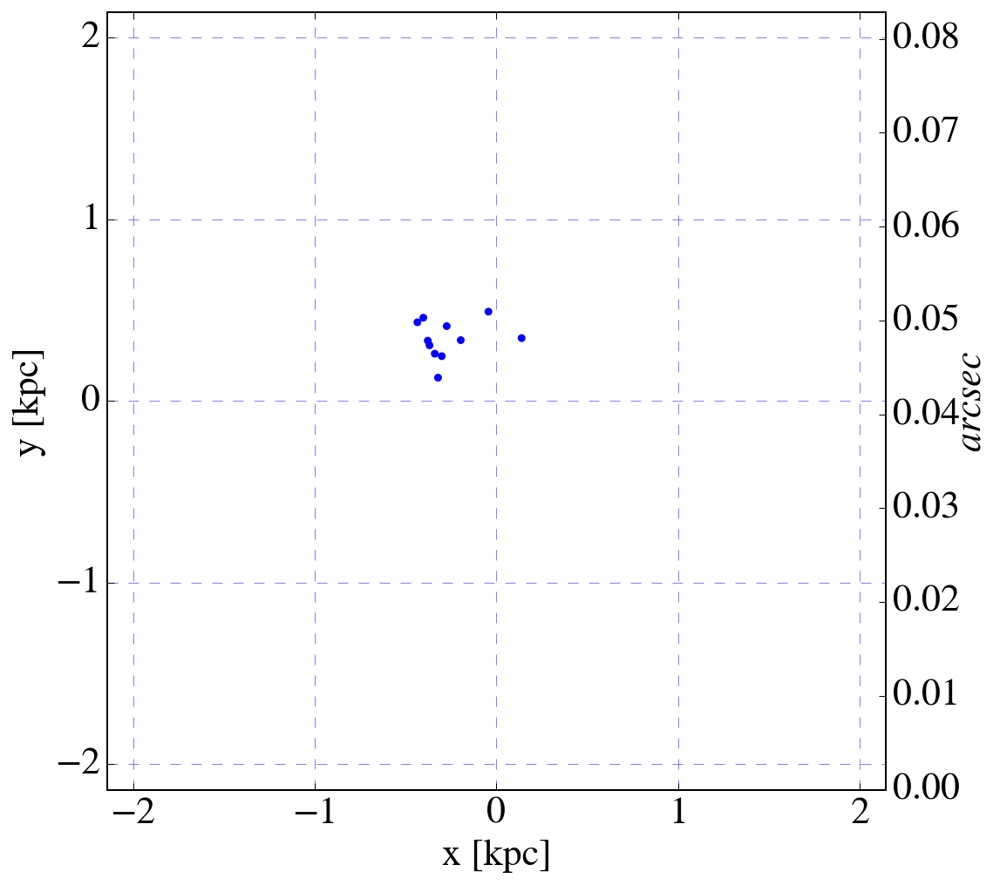

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
# Pass locs and halosPos in kpc... 
# radius = 3.0
haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                      [811,197.0,2574],radius)

print("Halo mass {} is {:.2e}".format(halo, np.sum(halomass)))

ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs

ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
ax.set_xlabel('x [kpc]')
ax.set_ylabel('y [kpc]')
ax.set_xlim([-radius,radius])
ax.set_ylim([-radius,radius])
hax2 = ax.twinx()
hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
hax2.set_ylabel(r'$arcsec$')
hax2.yaxis.labelpad = -3
del ax
gc.collect()

# Find all the 'unfound' halos...
Systematically remove all of the stars in a complete list of stars that are within 'distance' of a halo.

In [79]:
distance = 15.0 #kpc
stars = locs * 1000.0
masses = mass
print(len(stars))
for aHalo in halosPos*1000:
    centrd    = stars - aHalo
    dists     = np.linalg.norm(centrd,axis=1)
    stars = stars[dists > distance] # Keep stars not in this halo
    masses = masses[dists > distance] # Keep star masses not in this halo
print(len(stars))

31533
1026


In [80]:
# Use stars and masses from above!
rad = 5
i = 0
while len(stars):
    aStar = stars[0]
    centrd     = stars - aStar # Distances between aStar and all others... 
    dists      = np.linalg.norm(centrd,axis=1)
    haloStars  = centrd[dists <= rad] # Get nearby stars locations normalized to 'aStar'...
    haloMasses = masses[dists <= rad] # Get masses
    stars      = stars[dists > rad]  # Remove the stars from the list
    print("Halo {:2d} has {:3d} sps and mass {:.3e}".format(i,len(haloStars),np.sum(haloMasses) * u.solMass))
    i += 1
print(len(stars))

Halo  0 has  13 sps and mass 5.366e+04 solMass
Halo  1 has   7 sps and mass 2.889e+04 solMass
Halo  2 has   4 sps and mass 1.651e+04 solMass
Halo  3 has   3 sps and mass 1.238e+04 solMass
Halo  4 has   7 sps and mass 2.889e+04 solMass
Halo  5 has  60 sps and mass 2.423e+05 solMass
Halo  6 has   7 sps and mass 2.889e+04 solMass
Halo  7 has   7 sps and mass 2.889e+04 solMass
Halo  8 has   6 sps and mass 2.477e+04 solMass
Halo  9 has   1 sps and mass 4.128e+03 solMass
Halo 10 has  64 sps and mass 2.588e+05 solMass
Halo 11 has  26 sps and mass 1.065e+05 solMass
Halo 12 has  29 sps and mass 1.185e+05 solMass
Halo 13 has   3 sps and mass 1.238e+04 solMass
Halo 14 has   4 sps and mass 1.651e+04 solMass
Halo 15 has  35 sps and mass 1.428e+05 solMass
Halo 16 has   3 sps and mass 1.238e+04 solMass
Halo 17 has   2 sps and mass 8.256e+03 solMass
Halo 18 has  24 sps and mass 9.618e+04 solMass
Halo 19 has  38 sps and mass 1.540e+05 solMass
Halo 20 has   4 sps and mass 1.651e+04 solMass
Halo 21 has  

/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1013
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1006
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1002
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 999
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/i

Total mass in stars 4077449.350153555


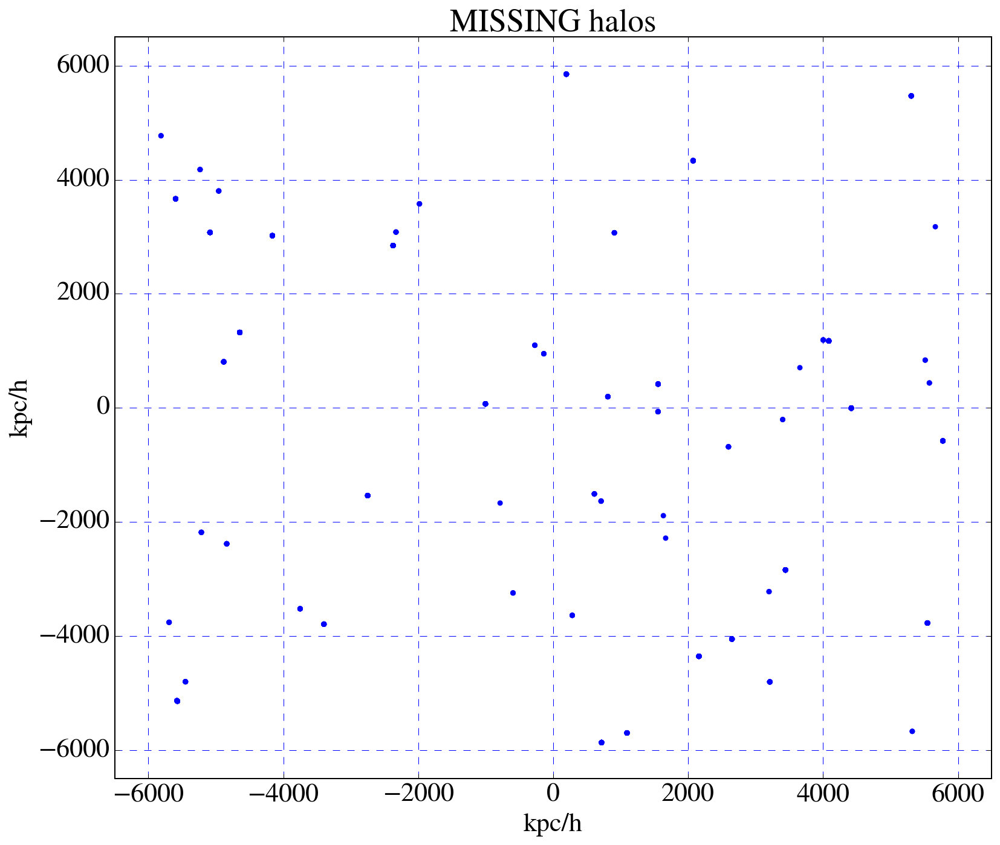

In [67]:
plt.scatter(stars[:,0],stars[:,1],s=20,c='b', edgecolors='none') # Plot star particles
plt.xlabel('kpc/h')
plt.ylabel('kpc/h')
plt.grid(b=True, which='major', color='b', linestyle='--')
plt.xlim([-6500,6500])
plt.ylim([-6500,6500])
plt.title('MISSING halos')
print("Total mass in stars {}".format(np.sum(masses)))

In [68]:
def plotOne(theStars,masses,size,x,y):
    fig, ax = plt.subplots(1, 1, figsize=(8,8))

    ax.scatter(theStars[:,0],theStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs
    ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim([-size,size])
    ax.set_ylim([-size,size])
    plt.title("Coords ({:.1f} {:.1f}) kpc".format(x,y))
    hax2 = ax.twinx()
    hax2.set_ylim([0,size * 2.0 * arcSec_per_kpc_comov])
    hax2.set_ylabel(r'$arcsec$')
    hax2.yaxis.labelpad = -3
#     plt.savefig('/Users/earnric/Desktop/SP-galaxy_z_{}_{}.png'.format(z,halo),dpi=fig.dpi,bbox_inches='tight')
    del ax


In [69]:
len(stars)

1026

31533
1026
Halo  0 has  13 sps and mass 5.366e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1013
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1006


Halo  1 has   7 sps and mass 2.889e+04 solMass
Halo  2 has   4 sps and mass 1.651e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 1002
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 999


Halo  3 has   3 sps and mass 1.238e+04 solMass
Halo  4 has   7 sps and mass 2.889e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 992
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 932


Halo  5 has  60 sps and mass 2.423e+05 solMass
Halo  6 has   7 sps and mass 2.889e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 925
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 918


Halo  7 has   7 sps and mass 2.889e+04 solMass
Halo  8 has   6 sps and mass 2.477e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 912
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 911


Halo  9 has   1 sps and mass 4.128e+03 solMass
Halo 10 has  64 sps and mass 2.588e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 847
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 821


Halo 11 has  26 sps and mass 1.065e+05 solMass
Halo 12 has  29 sps and mass 1.185e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 792


Halo 13 has   3 sps and mass 1.238e+04 solMass
Halo 14 has   4 sps and mass 1.651e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 789
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 785
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 750


Halo 15 has  35 sps and mass 1.428e+05 solMass
Halo 16 has   3 sps and mass 1.238e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 747


Halo 17 has   2 sps and mass 8.256e+03 solMass
Halo 18 has  24 sps and mass 9.618e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 745
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 721


Halo 19 has  38 sps and mass 1.540e+05 solMass
Halo 20 has   4 sps and mass 1.651e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 683
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 679


Halo 21 has  40 sps and mass 1.614e+05 solMass
Halo 22 has  42 sps and mass 1.688e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 639
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 597


Halo 23 has   4 sps and mass 1.651e+04 solMass
Halo 24 has   3 sps and mass 1.238e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 593
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 590


Halo 25 has  37 sps and mass 1.498e+05 solMass
Halo 26 has   5 sps and mass 2.064e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 553
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 548


Halo 27 has  17 sps and mass 7.017e+04 solMass
Halo 28 has  59 sps and mass 2.382e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 531
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 472


Halo 29 has   1 sps and mass 4.128e+03 solMass
Halo 30 has  76 sps and mass 3.083e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 471
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 395


Halo 31 has   4 sps and mass 1.651e+04 solMass
Halo 32 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 391
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 389


Halo 33 has   2 sps and mass 8.256e+03 solMass
Halo 34 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 387
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 386


Halo 35 has  13 sps and mass 5.366e+04 solMass
Halo 36 has  11 sps and mass 4.541e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 373
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 362
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 357


Halo 37 has   5 sps and mass 2.064e+04 solMass
Halo 38 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 356


Halo 39 has   1 sps and mass 4.128e+03 solMass
Halo 40 has   4 sps and mass 1.651e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 355
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 351


Halo 41 has  50 sps and mass 2.010e+05 solMass
Halo 42 has  40 sps and mass 1.614e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 301
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 261


Halo 43 has  61 sps and mass 2.464e+05 solMass
Halo 44 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 200
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 198


Halo 45 has  16 sps and mass 6.604e+04 solMass
Halo 46 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 182
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 180


Halo 47 has   6 sps and mass 2.477e+04 solMass
Halo 48 has  27 sps and mass 1.102e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 174
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 147


Halo 49 has  51 sps and mass 2.052e+05 solMass
Halo 50 has  30 sps and mass 1.226e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 96
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 66


Halo 51 has   4 sps and mass 1.651e+04 solMass
Halo 52 has   7 sps and mass 2.889e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 62
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 55


Halo 53 has  39 sps and mass 1.577e+05 solMass
Halo 54 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 16
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1026 but corresponding boolean dimension is 14


Halo 55 has  14 sps and mass 5.779e+04 solMass
0


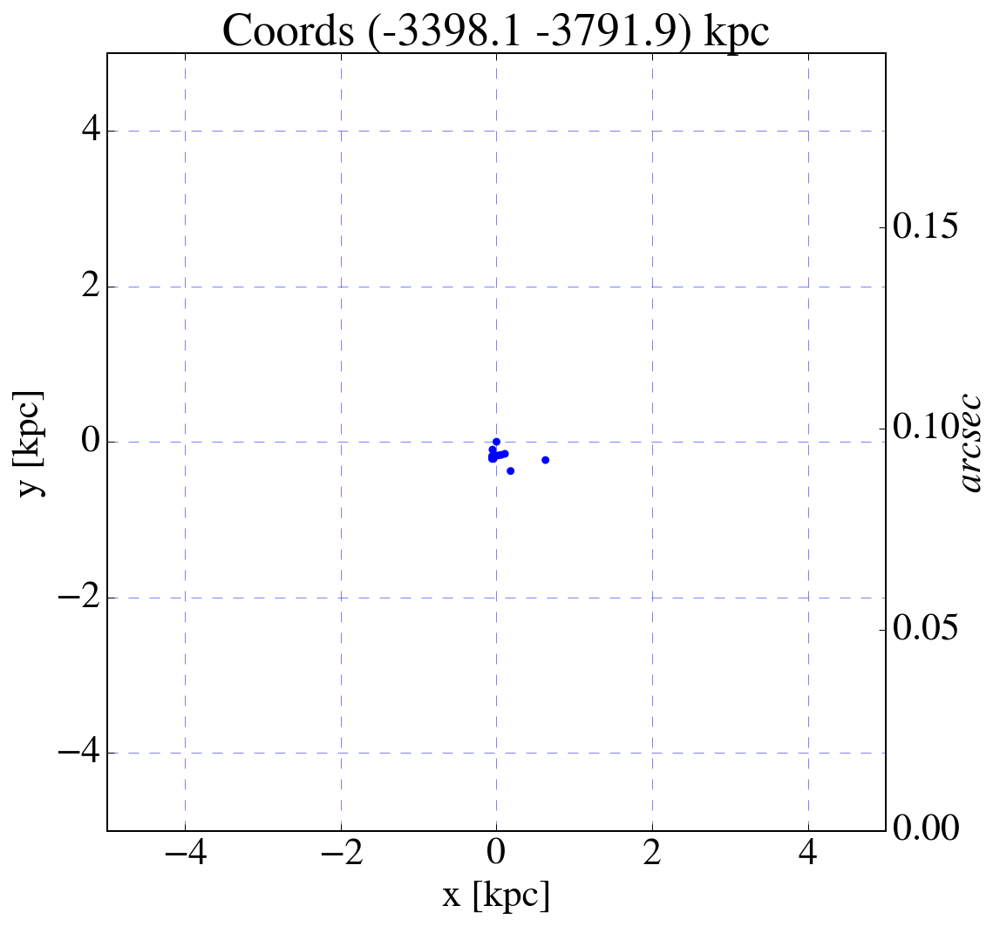

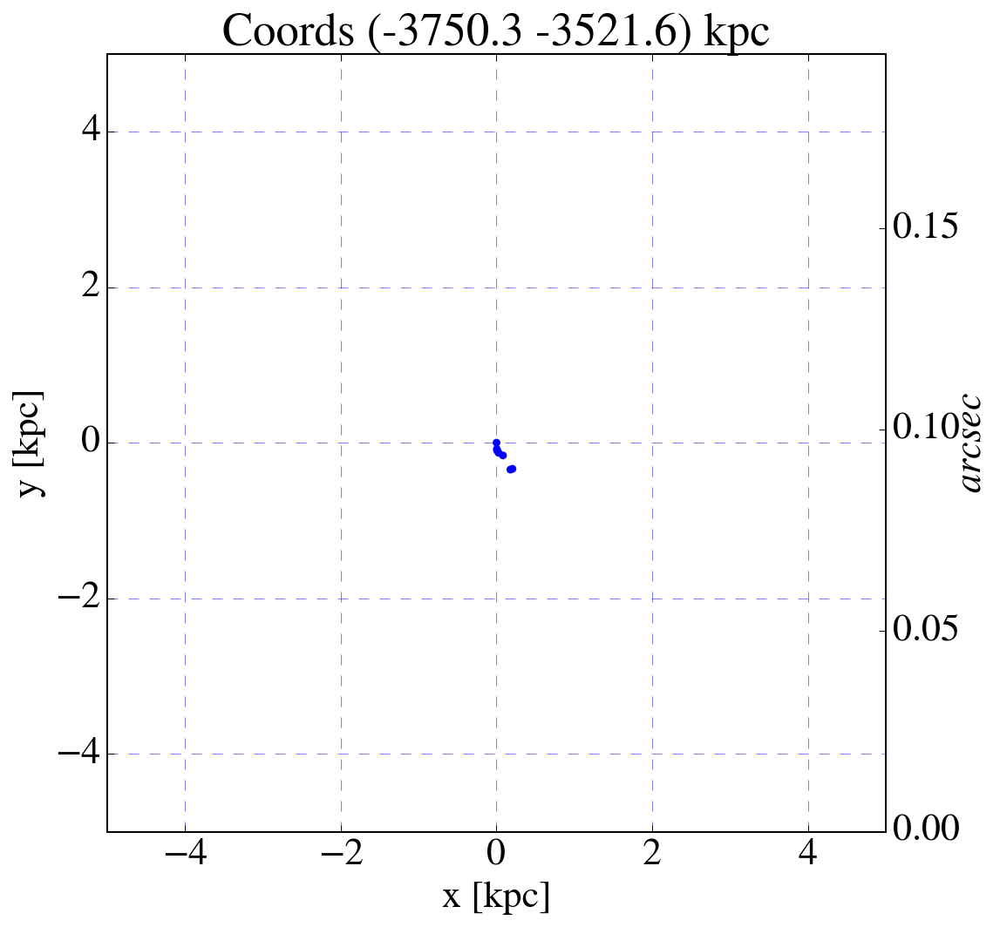

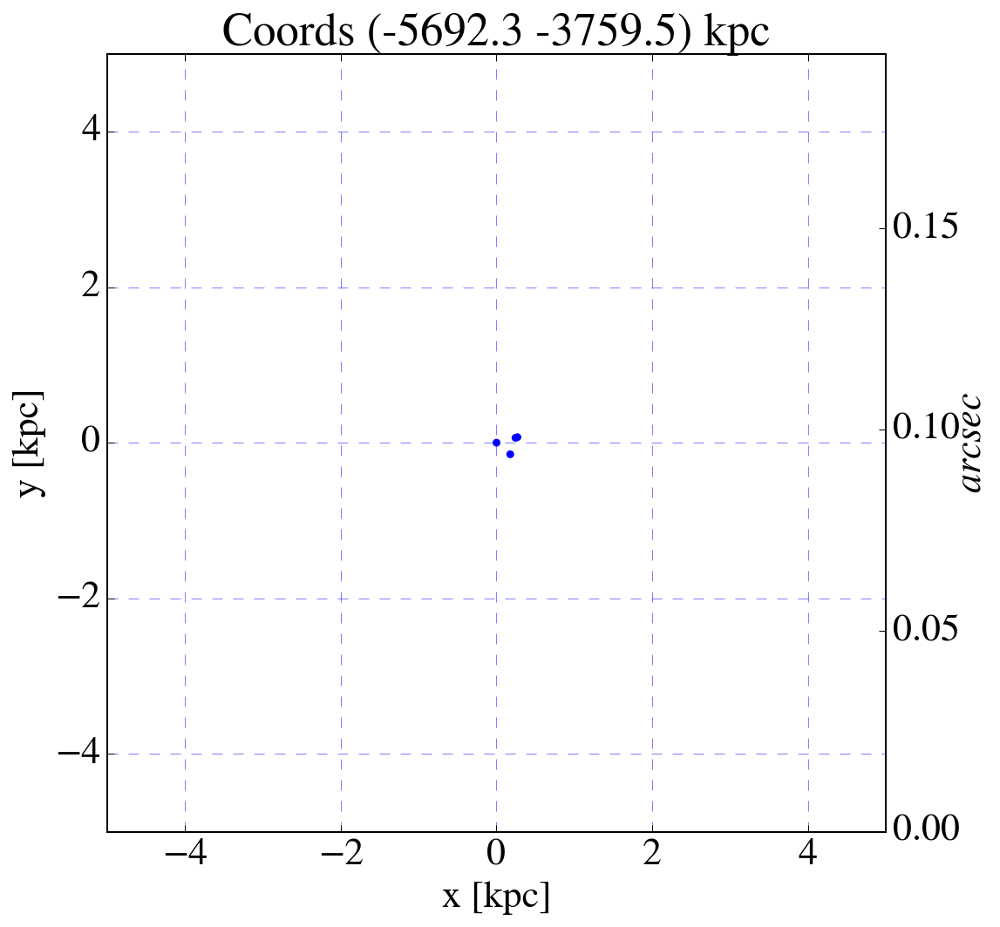

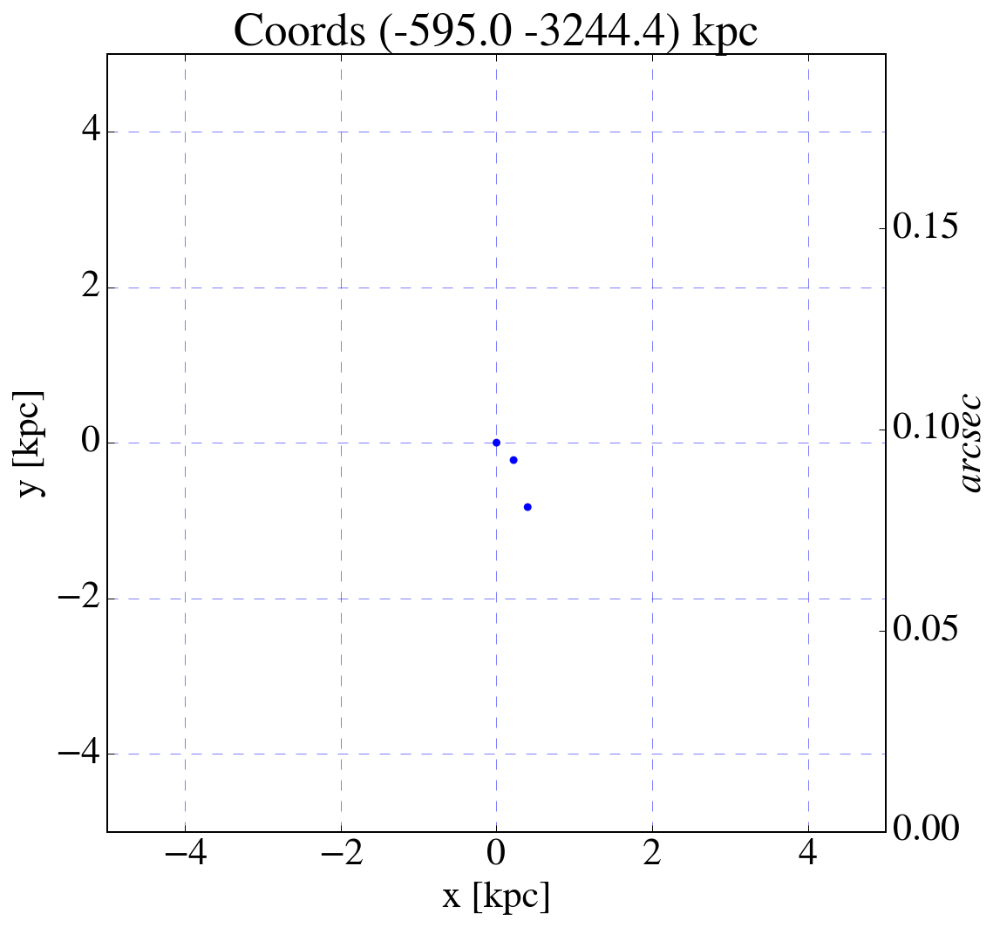

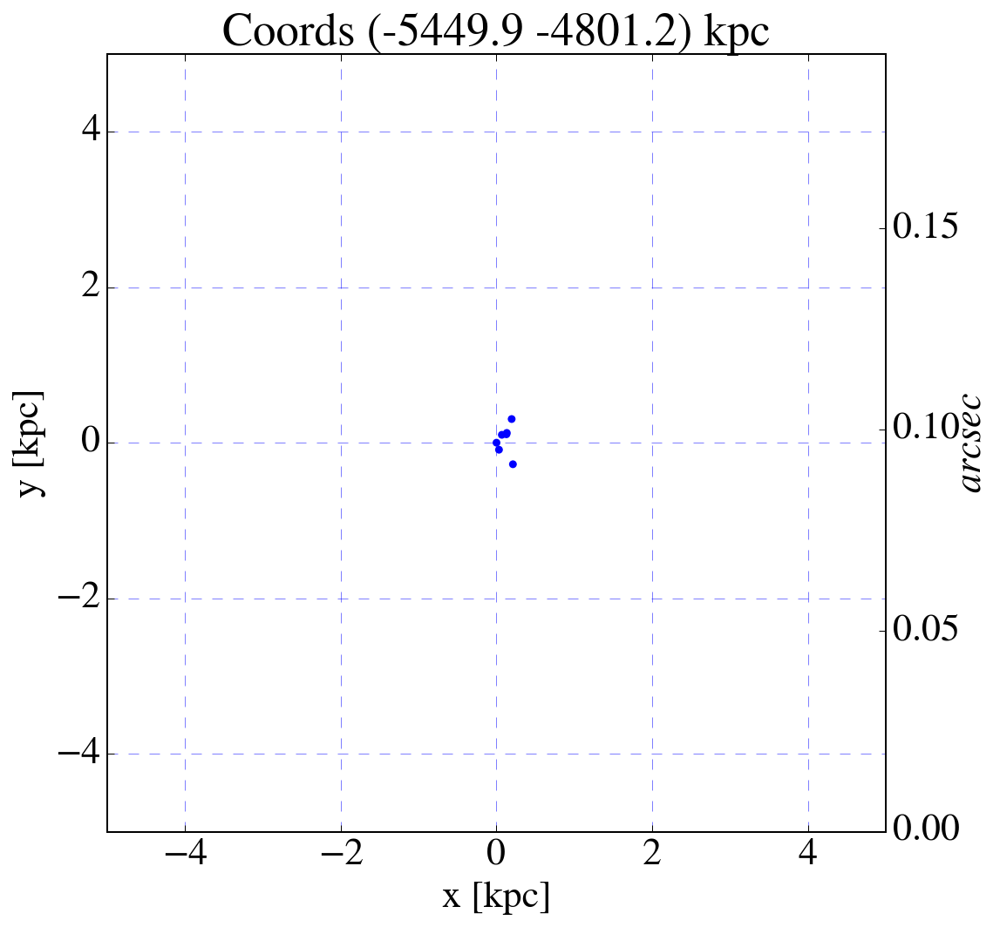

...

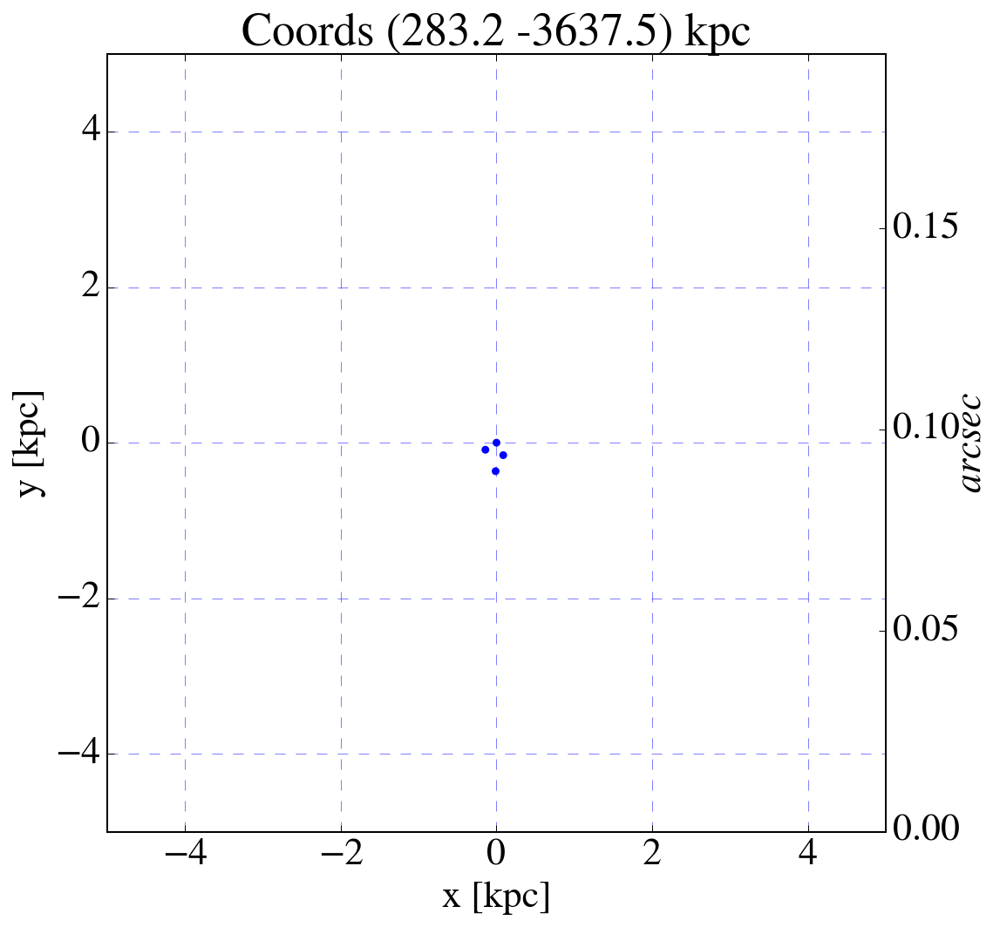

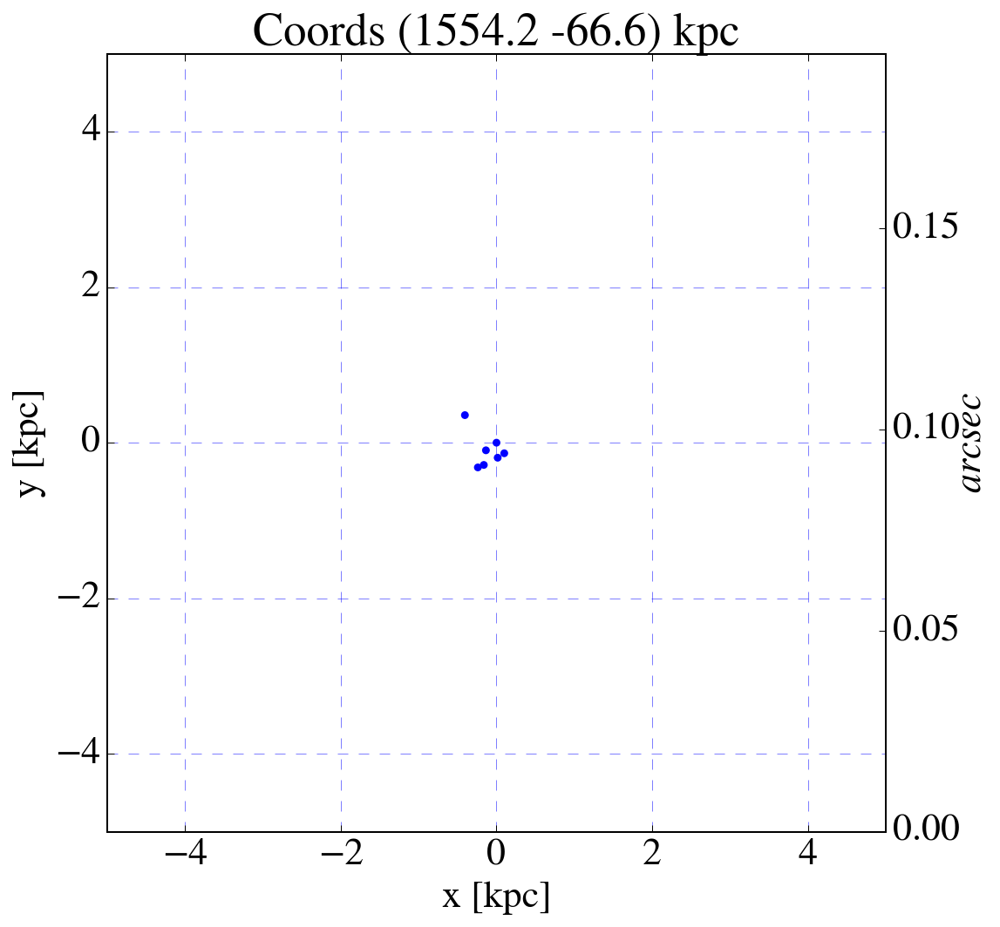

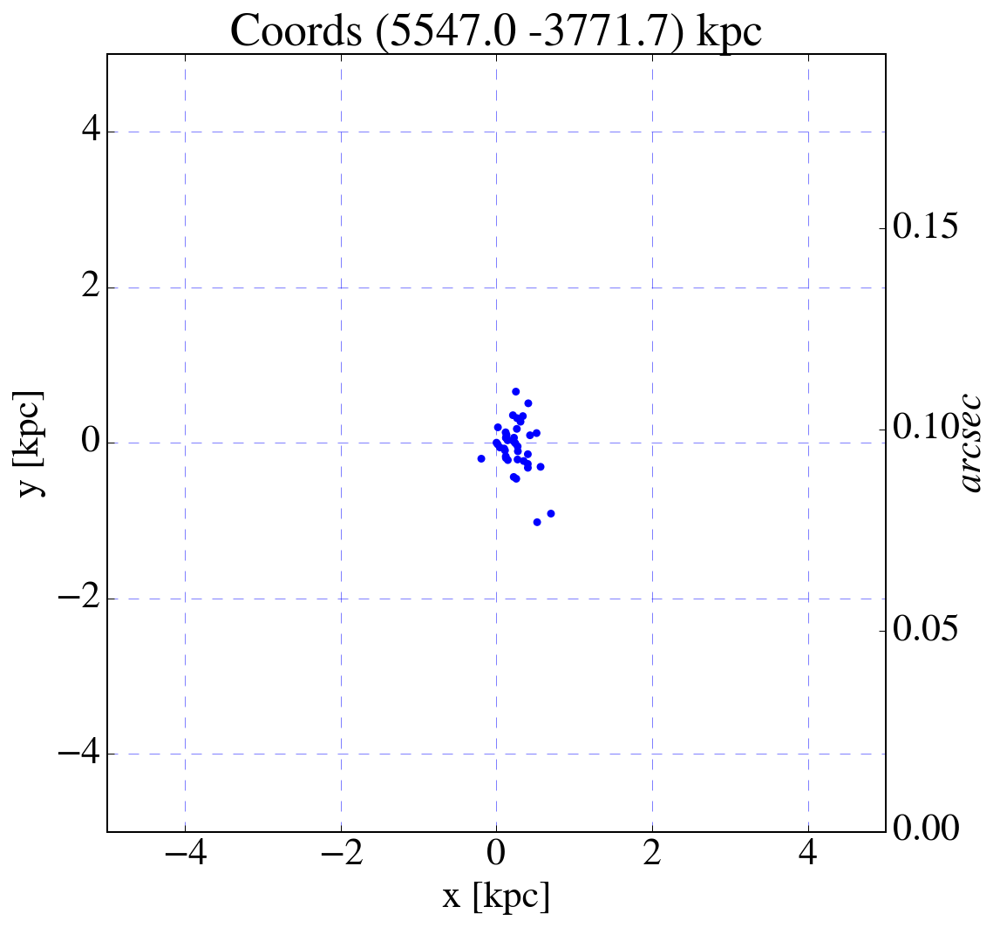

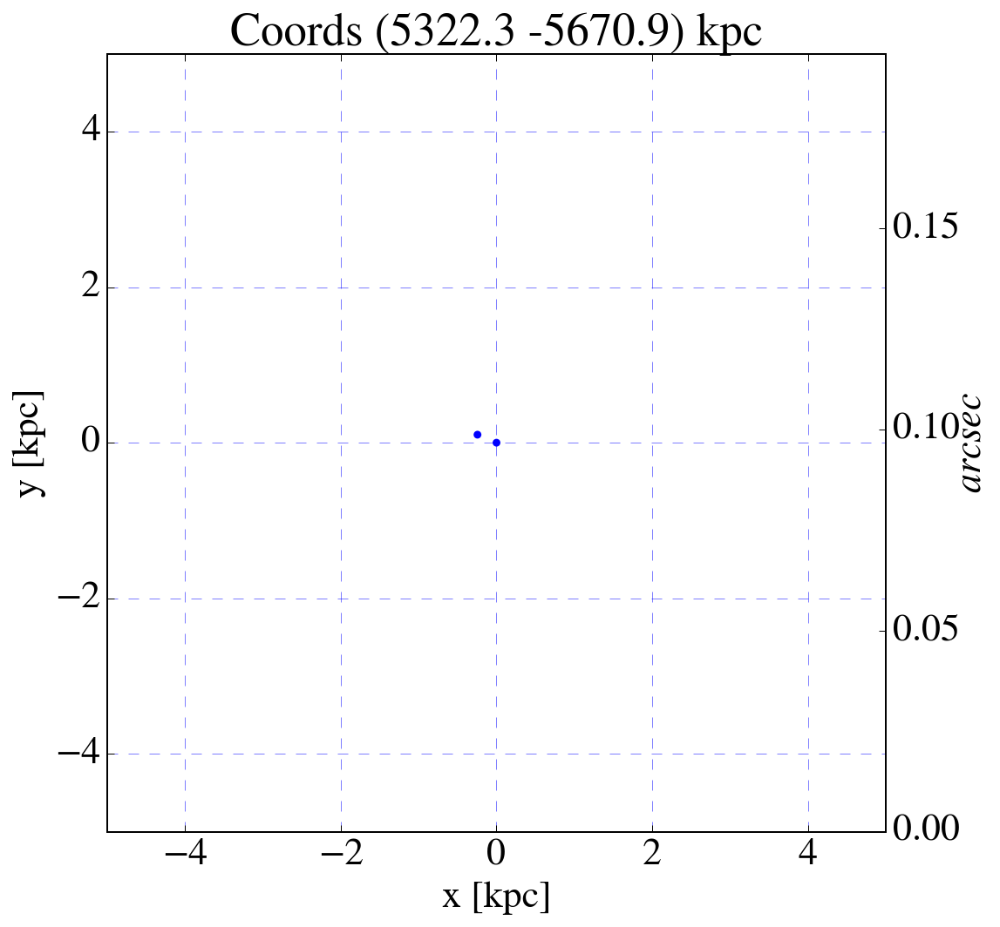

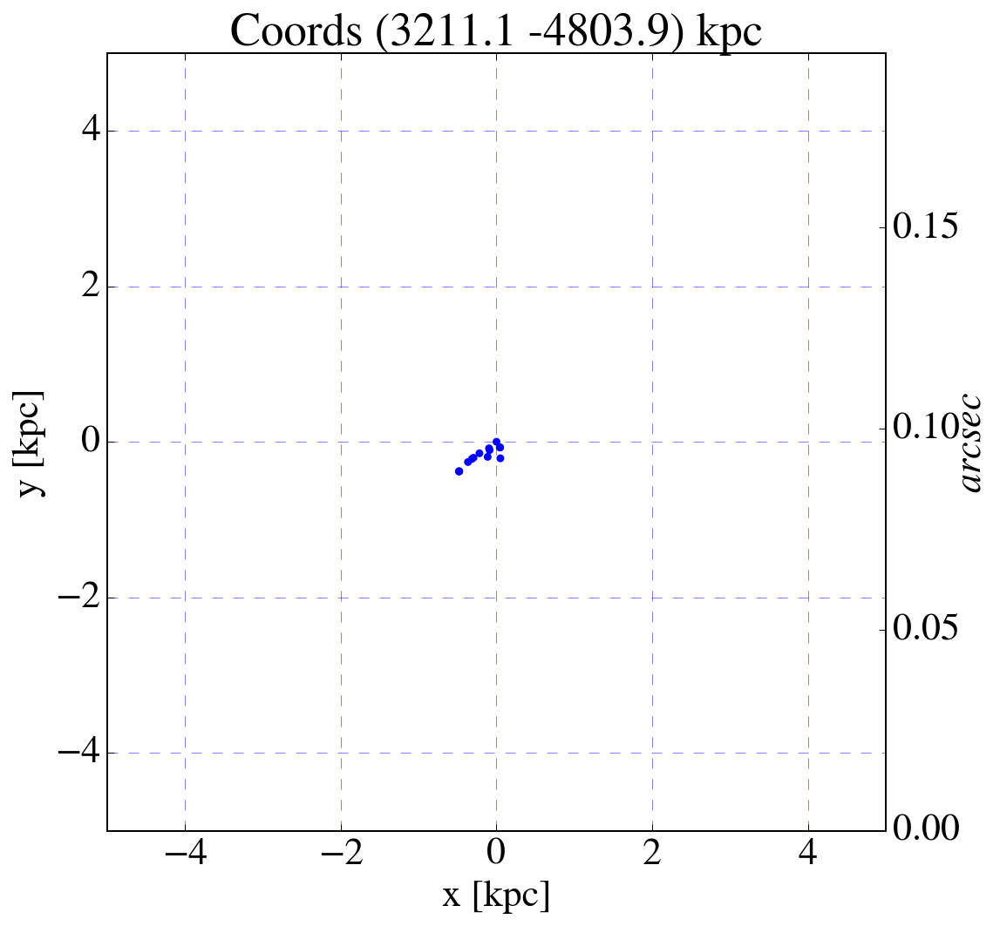

In [84]:
distance = 15.0 #kpc
stars = locs * 1000.0
masses = mass
print(len(stars))
for aHalo in halosPos*1000:
    centrd    = stars - aHalo
    dists     = np.linalg.norm(centrd,axis=1)
    stars = stars[dists > distance] # Keep stars not in this halo
    masses = masses[dists > distance] # Keep star masses not in this halo
print(len(stars))

# Use stars and masses from above!
rad = 5
i = 0
while len(stars):
    aStar = stars[0]
    centrd     = stars - aStar # Distances between aStar and all others... 
    dists      = np.linalg.norm(centrd,axis=1)
    haloStars  = centrd[dists <= rad] # Get nearby stars locations normalized to 'aStar'...
    haloMasses = masses[dists <= rad] # Get masses
    plotOne(haloStars,haloMasses,rad,aStar[0],aStar[1])
    stars      = stars[dists > rad]  # Keep only stars outside distance
    print("Halo {:2d} has {:3d} sps and mass {:.3e}".format(i,len(haloStars),np.sum(haloMasses) * u.solMass))
    i += 1
    gc.collect()
    
print(len(stars))

In [83]:
aStar

array([ 3211.05033649, -4803.93400633, -5061.69322537])

# Process z=15, output_00028

In [85]:
# Make sure we have halo information for this z... hop/...
num = 28 # This is the output_00num file that has the "info_" for finding the boxsize... see map above.
z   = 15.0

prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
infoSize = lsp.getBoxSize(num,prefix) ### REMEMBER to Load from info_xxxx ###
print("Using info size, astro convert = {:.3f}".format((infoSize * u.cm).to(u.kpc)) )
boxsizekpc = (infoSize * u.cm).to(u.kpc).value

rho_critDMz = myCosmo.critical_density(z) * myCosmo.Odm(z) # rho_crit @ z for DM only
print('$rho_crit,dm,{:.1f}$ = {:.3e}'.format(z,rho_critDMz))

gc.collect()

Using info size, astro convert = 1054.402 kpc
$rho_crit,dm,15.0$ = 8.614e-27 g / cm3


391102

In [86]:
locsRaw, mass, bt, Z, PZ, PPF = lsp.loadSP(z)
##############################################
# Need to correct the Z and PZ for the pristine
# fraction of the SP... 
##############################################
fpol = 1.0-PPF
fpol[fpol < 1e-5] = 0.0 # Don't form polluted stars when fpol is very small

Z_corr = Z/fpol
Z_corr[np.isinf(Z_corr)] = 0.9e-5 # Make the Z of the particles < Z_crit (1e-5)
Z_corr[Z_corr < 1e-5]    = 0.9e-5 # Place them all just below Z_crit
gc.collect()
locsRaw.size

/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: RuntimeWarning: divide by zero encountered in true_divide


197046

In [87]:
# Convert to comoving Mpc ... 
locs = (locsRaw/boxsizekpc) * comovingBox

In [88]:
# Compute age of the star particles...
# spAges is in Myr ... 

baseAge = cosmo.ageAtz(71,z) # ageAtZ return Myr, parameters are H and z
print("My code - Age at z={} is {:.2f} Myr".format(z,baseAge))
spAges = baseAge - bt/1e6    # bt from SP file is in yr, convert to Myr... 
print("Star particle age range {:.2f} Myr - {:.2f} Myr".format(min(spAges),max(spAges)))
print("Star particle Z range   {:.3e} Solar - {:.4f} Solar".format(min(Z),max(Z)))

My code - Age at z=15.0 is 277.79 Myr
Star particle age range 1.07 Myr - 125.24 Myr
Star particle Z range   5.000e-09 Solar - 0.2316 Solar


In [89]:
arcPerKpcC = myCosmo.arcsec_per_kpc_comoving(z=z)
print('AstroPy - Comoving @ {}, {:.4f}'.format(z,arcPerKpcC))
arcPerKpcP = myCosmo.arcsec_per_kpc_proper(z=z)
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,arcPerKpcP))
print('AstroPy -  Proper @  {}, {:.4f}'.format(z,1/arcPerKpcP))

kpcPerArcSec = cosmo.arcAtz(71,z=z,om=0.267) # size of an arcsec at the specified reshift in kpc
print('My code - Comoving @ {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec/(1+z)))
print('My code -  Proper @  {}, {:.4f} arcsec / kpc'.format(z,1/kpcPerArcSec))
print('My code -  Proper @  {}, {:.4f} kpc / arcsec'.format(z,kpcPerArcSec))

AstroPy - Comoving @ 15.0, 0.0196 arcsec / kpc
AstroPy -  Proper @  15.0, 0.3132 arcsec / kpc
AstroPy -  Proper @  15.0, 3.1930 kpc / arcsec
My code - Comoving @ 15.0, 0.0195 arcsec / kpc
My code -  Proper @  15.0, 0.3114 arcsec / kpc
My code -  Proper @  15.0, 3.2115 kpc / arcsec


In [90]:
myCosmo.age(z)

<Quantity 0.27571487634505576 Gyr>

In [91]:
##
## Load the halo locations
## hop halo pos file key:    #   npart,mass,cont.frac,xc,yc,zc,uc,vc,wc
## Scale locations to co-moving coordates

## THESE HALOS ARE BASED ON STAR PARTICLE LOCATIONS ##
##
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/12Mpc-n.48-eps20-output/'
prefix = '/Users/earnric/Research/RAMSES-Data/12Mpc-n.48-eps20/'
halosRawPos = lsp.loadHaloGrps(num,prefix=prefix+'hopStarData/') # Returns positions normalized to (-0.5, 0.5)
halossizes = lsp.loadHaloSizes(num,prefix=prefix+'hopStarData/') # Returns positions normalized to (-0.5, 0.5)
# halosRawPos = lsp.loadHaloGrps(num) # Returns positions normalized to (-0.5, 0.5)
# halossizes = lsp.loadHaloSizes(num) # Returns positions normalized to (-0.5, 0.5)

#halosPos = halosRawPos * boxsizekpc
halosPos = halosRawPos * comovingBox  # Comoving box 
print("Num of halos @ {} = {}".format(z,len(halosRawPos)))

Num of halos @ 15.0 = 298


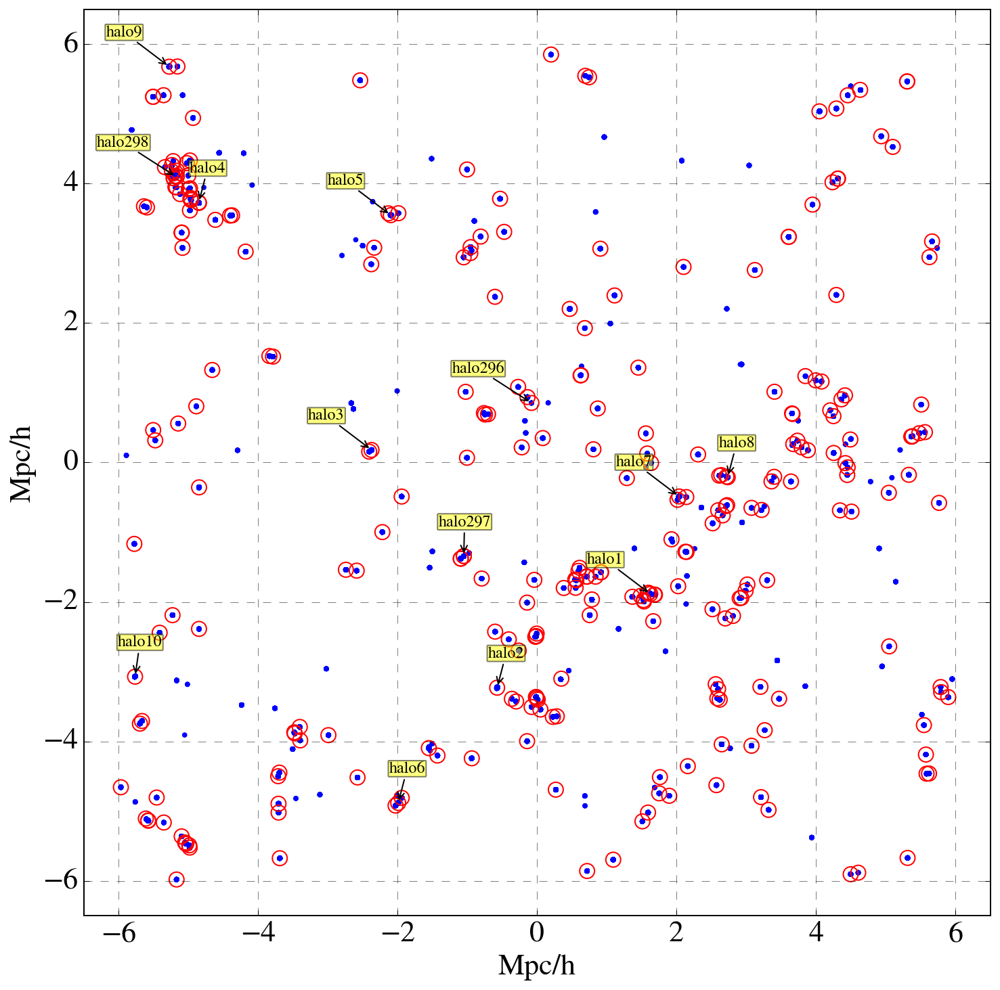

449

In [92]:
fig, ax = plt.subplots(1, 1, figsize=(12,12))
# COORDINATES ARE COMOVING MPC / H
labels = ['halo{0}'.format(i+1) for i in range(len(halosPos))]
plt.scatter(locs[:,0],locs[:,1],s=15,c='b', edgecolors='none') # Plot star particles
plt.scatter(halosPos[:,0],halosPos[:,1],s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='k', linestyle='--',alpha=0.5)
plt.xlabel('Mpc/h')
plt.ylabel('Mpc/h')
plt.xlim([-6.5,6.5])
plt.ylim([-6.5,6.5])
# plt.title('z=%.1lf stars & halo finder'%z)
sign = 1
for label, x, y in zip(chain(labels[:10],labels[-3:]), 
                       chain(halosPos[:,0][:10],halosPos[:,0][-3:]),
                       chain(halosPos[:,1][:10],halosPos[:,1][-3:])):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (-20 * sign, 20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=12,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    sign *= -1
plt.savefig(prefix+"starsAndHalos_{}.pdf".format(z),dpi=fig.dpi,bbox_inches='tight')
plt.show()
gc.collect()
 

arc sec/kpc = 0.020
********************** Halo 0 **********************
Stellar mass in view 0 is 2.52e+07 solMass
radius 17.53
Stellar mass in halo 0 is 2.53e+07 solMass
********************** Halo 1 **********************
Stellar mass in view 1 is 1.73e+07 solMass
radius 15.47
Stellar mass in halo 1 is 1.74e+07 solMass
********************** Halo 2 **********************
Stellar mass in view 2 is 9.05e+06 solMass
radius 12.46
Stellar mass in halo 2 is 9.05e+06 solMass
********************** Halo 295 **********************
Stellar mass in view 295 is 3.30e+04 solMass
radius 1.92
Stellar mass in halo 295 is 3.30e+04 solMass
********************** Halo 296 **********************
Stellar mass in view 296 is 1.54e+06 solMass
radius 6.90
Stellar mass in halo 296 is 1.54e+06 solMass
********************** Halo 297 **********************
Stellar mass in view 297 is 1.53e+06 solMass
radius 6.89
Stellar mass in halo 297 is 3.30e+04 solMass


13186

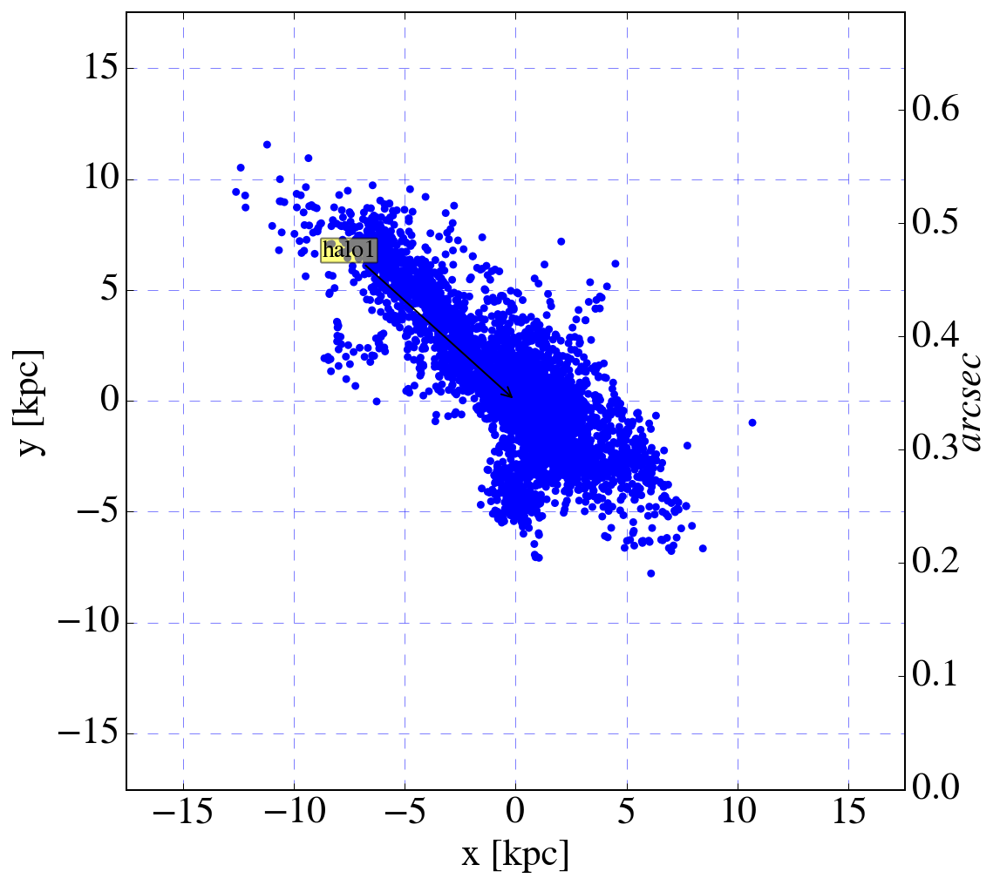

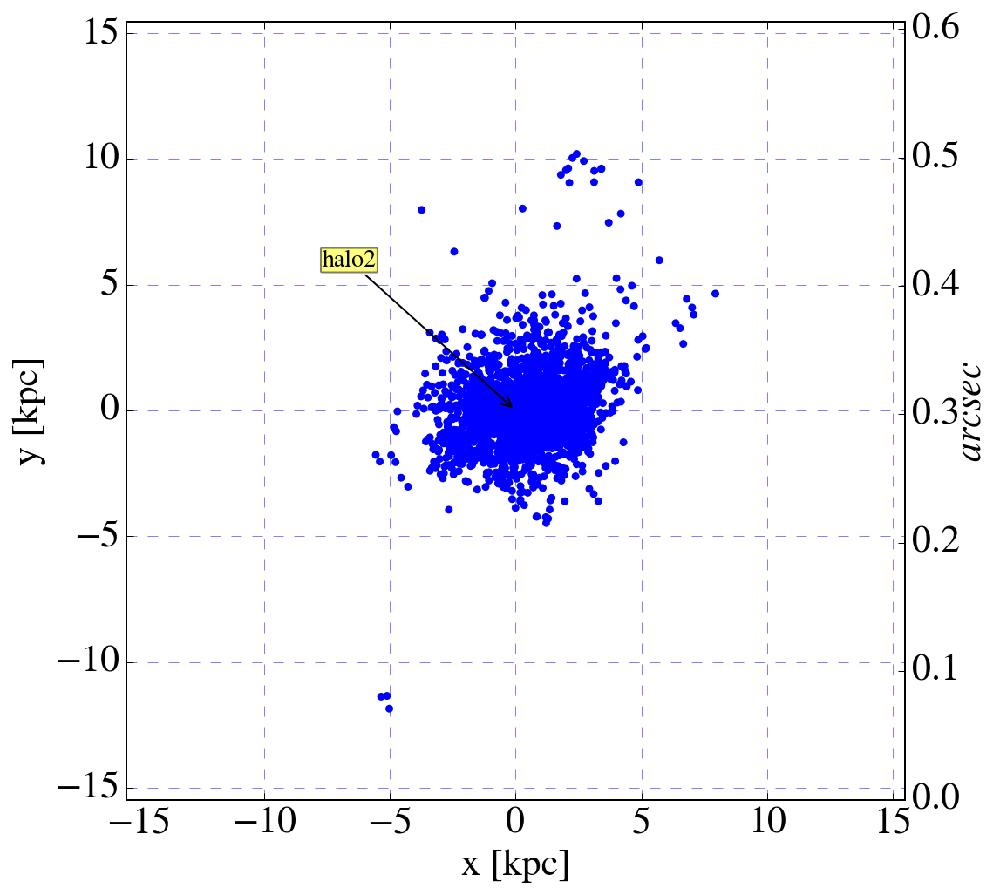

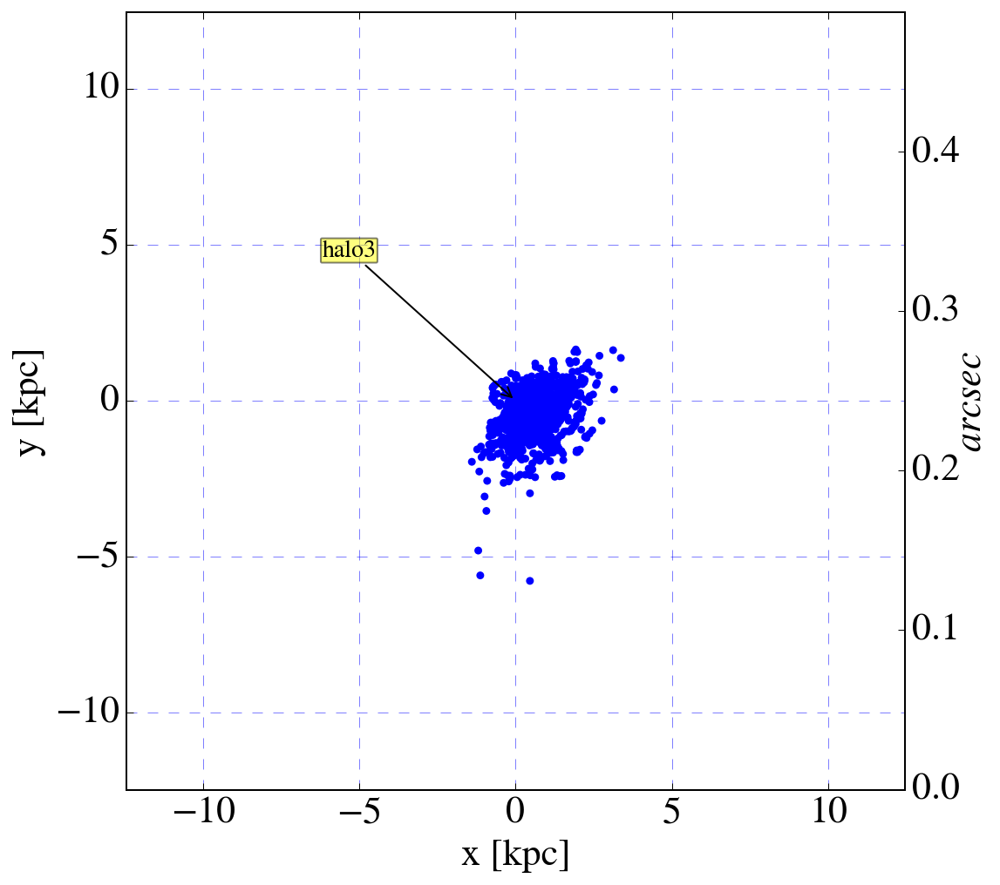

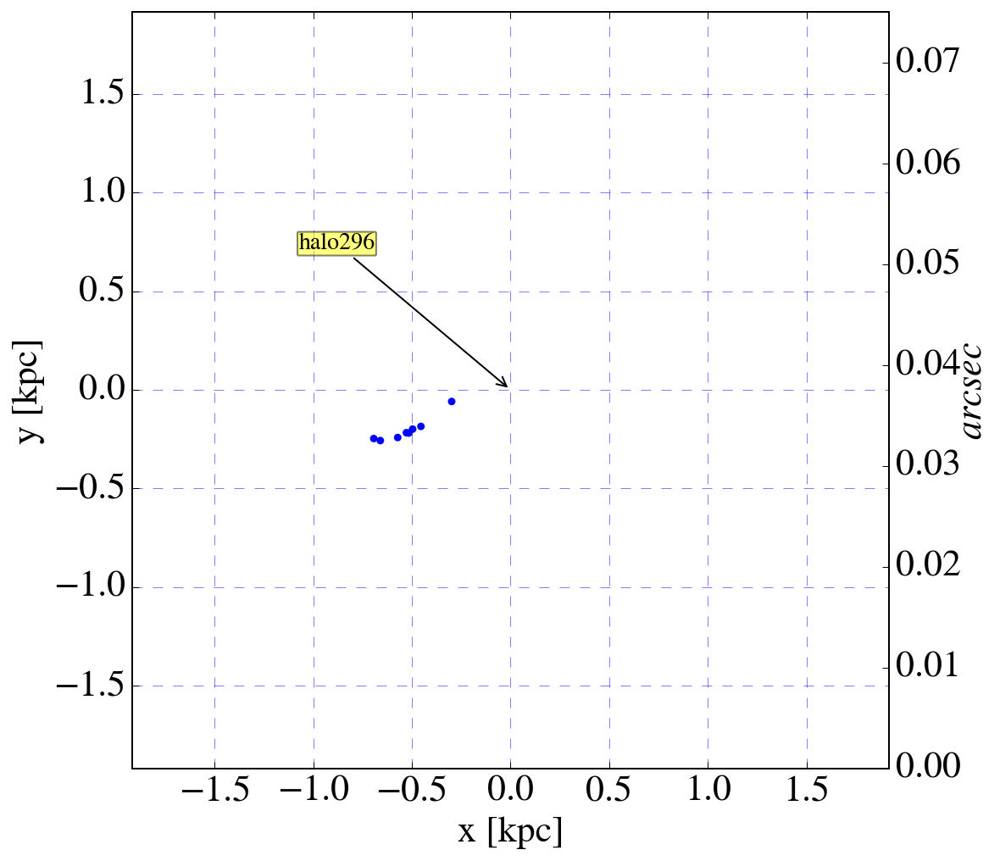

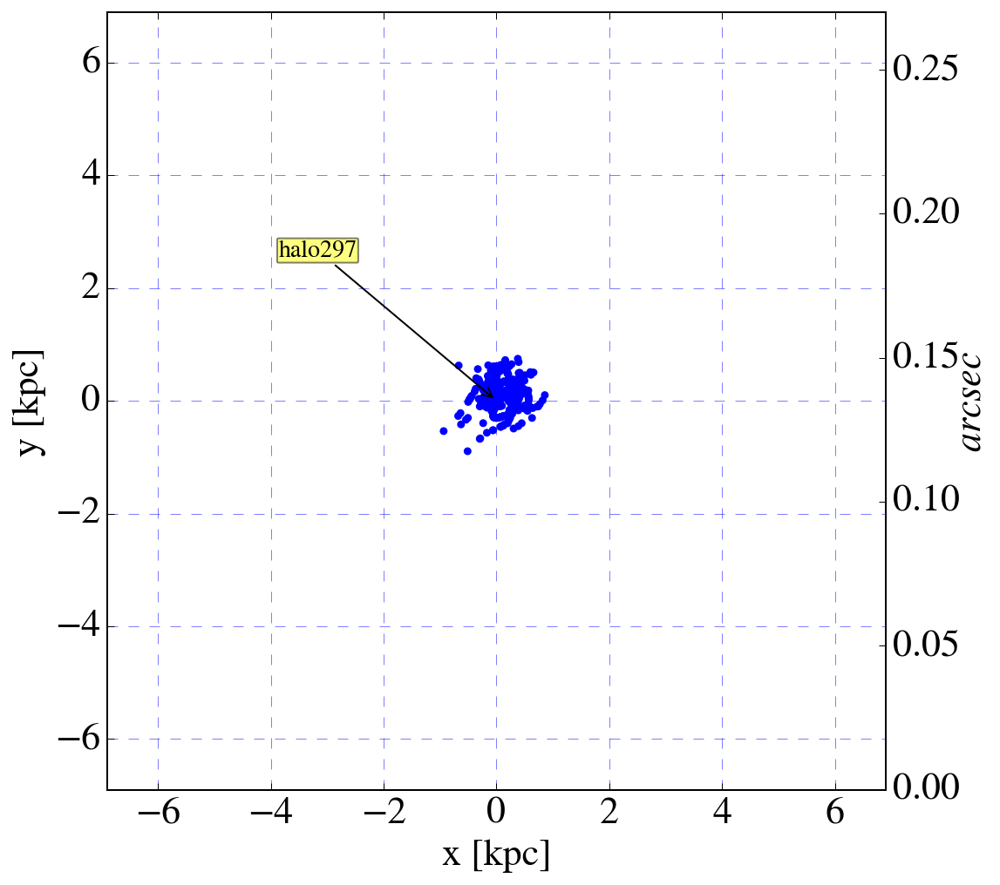

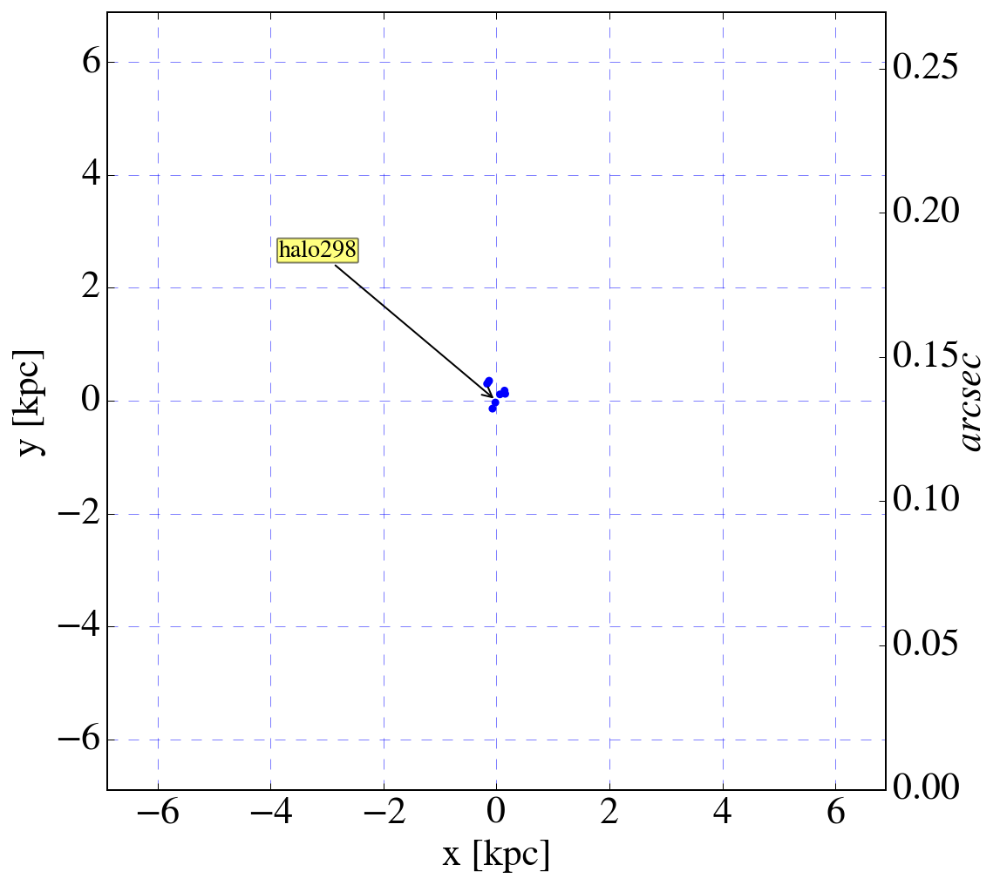

In [93]:
arcSec_per_kpc_comov = myCosmo.arcsec_per_kpc_comoving(z=z).value 
print("arc sec/kpc = {:.3f}".format(arcSec_per_kpc_comov))
radiusScaleFac = 1.5
for halo in chain(range(3),range(len(halosRawPos))[-3:]) :
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    print("********************** Halo {} **********************".format(halo))
    # Get the stars in view so we can compute a virius radius based on star particle mass
    viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = \
                halos.getViewStars(locs * 1000.0, mass,spAges,Z,PZ,PPF,halosPos[halo] * 1000.0, fov=20.0)
    totMass = np.sum(viewhalomass) * u.solMass
    print("Stellar mass in view {} is {:.2e}".format(halo,totMass))
    radius = ((totMass * 3.0/(4.0 * ma.pi) * \
               1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
    radius = radius.value * radiusScaleFac
    print('radius {:.2f}'.format(radius))

    # Pass locs and halosPos in kpc... 
    haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                          halosPos[halo] * 1000.0,radius)

    print("Stellar mass in halo {} is {:.2e}".format(halo, np.sum(halomass * u.solMass)))
    
    ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs
    ax.annotate(
        'halo{0}'.format(halo+1), 
        xy = (0, 0), xytext = (-80, 80),
        textcoords = 'offset points', ha = 'right', va = 'bottom',fontsize=14,
        bbox = dict(boxstyle = 'round,pad=0.05', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))
    ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim([-radius,radius])
    ax.set_ylim([-radius,radius])
    hax2 = ax.twinx()
    hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
    hax2.set_ylabel(r'$arcsec$')
    hax2.yaxis.labelpad = -3
#     plt.savefig('/Users/earnric/Desktop/SP-galaxy_z_{}_{}.png'.format(z,halo),dpi=fig.dpi,bbox_inches='tight')
    del ax
gc.collect()

# Check not-found halos...

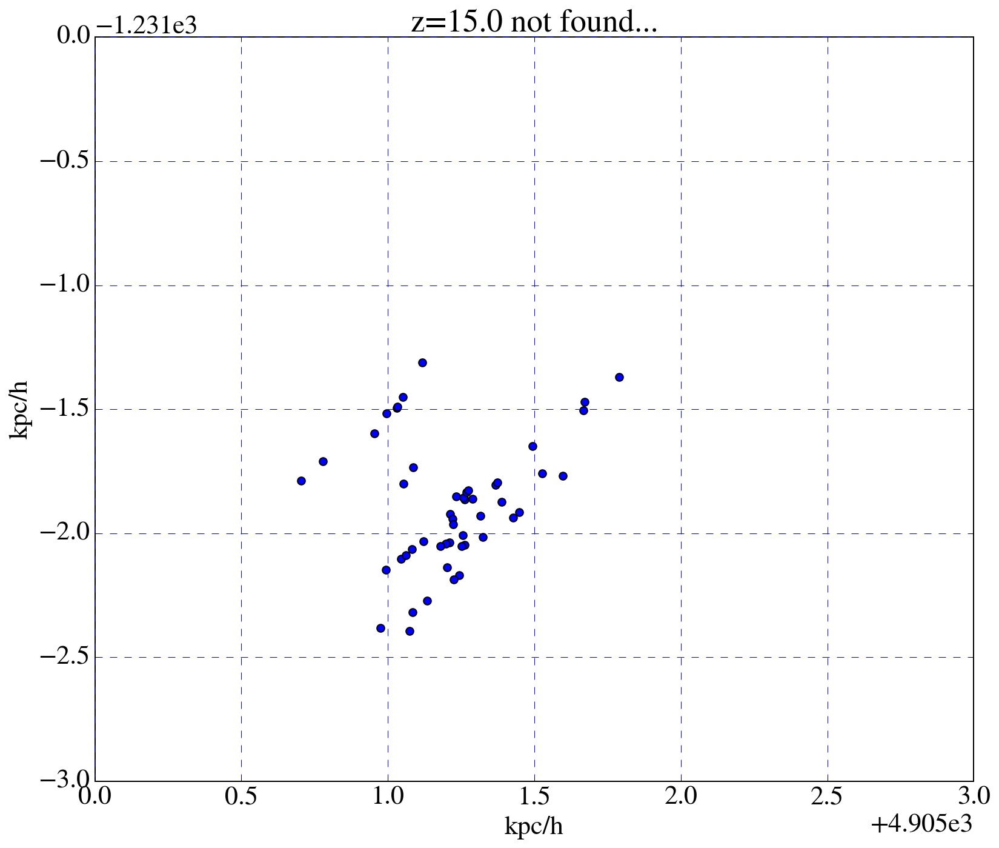

4111

In [106]:
htp = len(halosRawPos)
labels = ['halo{0}'.format(i) for i in range(len(halosPos))]
plt.scatter(locs[:,0]*1000,locs[:,1]*1000,s=40,c='b') # Plot star particles
plt.scatter(halosPos[:htp,0]*1000,halosPos[:htp,1]*1000,s=120,facecolors='none', edgecolors='r') # Plot halo locs
plt.grid(b=True, which='major', color='b', linestyle='--')
plt.xlabel('kpc/h')
plt.ylabel('kpc/h')
plt.xlim([4905,4908])
plt.ylim([-1234,-1231.0])

plt.title('z=%.1lf not found...'%z)

plt.show()
gc.collect()
 

In [107]:
# Determine the z coordiante ... use a view that looks through the entire vol
viewhaloStars,viewhalomass,viewhaloages,viewhaloZ,viewhaloPZ,viewhaloPPF = halos.getViewStars(locs * 1000.0,mass,spAges,
                                                                                        Z,PZ,PPF,[4905,-1234,0.0])

In [109]:
# Get z coord, compute mass of stars... 
viewhaloStars[:10],np.sum(viewhalomass),viewhaloZ[:10]

(array([[  1.21330024e+00,   1.07719517e+00,  -5.13346280e+03],
        [  1.22078463e+00,   1.05904405e+00,  -5.13343835e+03],
        [  1.22361812e+00,   1.03628404e+00,  -5.13340859e+03],
        [  1.25591822e+00,   9.91576739e-01,  -5.13374544e+03],
        [  1.20151592e+00,   8.63869004e-01,  -5.13354206e+03],
        [  1.08508052e+00,   6.81498053e-01,  -5.13328553e+03],
        [  9.75083188e-01,   6.19433564e-01,  -5.13408766e+03],
        [  1.24314491e+00,   8.30938383e-01,  -5.13369885e+03],
        [  1.22557026e+00,   8.13550839e-01,  -5.13367110e+03],
        [  1.13405566e+00,   7.27917625e-01,  -5.13353428e+03]]),
 203500.96473230387,
 array([  5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09,   5.00000000e-09,   5.00000000e-09,
          5.00000000e-09]))

In [110]:
radiusScaleFac = 1.5
radius = ((np.sum(viewhalomass) * u.solMass * 3.0/(4.0 * ma.pi) * \
           1.0/(myCosmo.critical_density(z) * myCosmo.Odm(z) * 100))**(1.0/3.0)).to(u.kpc) * (1.0 * z)
radius = radius.value * radiusScaleFac
radius

3.516685740117541

Halo mass 297 is 2.04e+05


12527

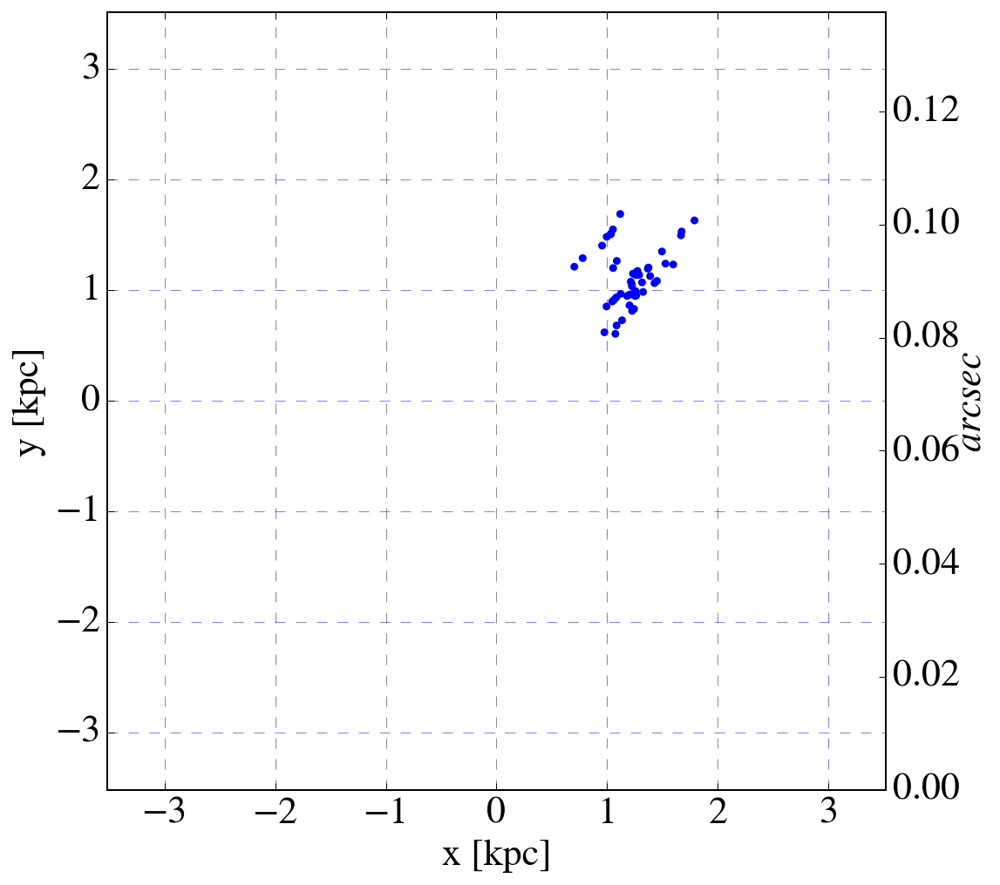

In [112]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
# Pass locs and halosPos in kpc... 
# radius = 3.0
haloStars,halomass,haloages,haloZ,haloPZ,haloPPF = halos.getHaloStars(locs * 1000.0,mass,spAges,Z,PZ,PPF,
                                                                      [4905,-1234,-5132],radius)

print("Halo mass {} is {:.2e}".format(halo, np.sum(halomass)))

ax.scatter(haloStars[:,0],haloStars[:,1],s=20,facecolors='b', edgecolors='None') # Plot halo locs

ax.grid(b=True, which='major', color='b', linestyle='--', alpha=0.5)
ax.set_xlabel('x [kpc]')
ax.set_ylabel('y [kpc]')
ax.set_xlim([-radius,radius])
ax.set_ylim([-radius,radius])
hax2 = ax.twinx()
hax2.set_ylim([0,radius * 2.0 * arcSec_per_kpc_comov])
hax2.set_ylabel(r'$arcsec$')
hax2.yaxis.labelpad = -3
del ax
gc.collect()

# Find all the 'unfound' halos...
Systematically remove all of the stars in a complete list of stars that are within 'distance' of a halo.

In [113]:
distance = 15.0 #kpc
stars = locs * 1000.0
masses = mass
print(len(stars))
for aHalo in halosPos*1000:
    centrd    = stars - aHalo
    dists     = np.linalg.norm(centrd,axis=1)
    stars = stars[dists > distance] # Keep stars not in this halo
    masses = masses[dists > distance] # Keep star masses not in this halo
print(len(stars))

65682
1193


In [114]:
# Use stars and masses from above!
rad = 5
i = 0
while len(stars):
    aStar = stars[0]
    centrd     = stars - aStar # Distances between aStar and all others... 
    dists      = np.linalg.norm(centrd,axis=1)
    haloStars  = centrd[dists <= rad] # Get nearby stars locations normalized to 'aStar'...
    haloMasses = masses[dists <= rad] # Get masses
    stars      = stars[dists > rad]  # Remove the stars from the list
    print("Halo {:2d} has {:3d} sps and mass {:.3e}".format(i,len(haloStars),np.sum(haloMasses) * u.solMass))
    i += 1
print(len(stars))

Halo  0 has  26 sps and mass 1.115e+05 solMass
Halo  1 has  63 sps and mass 2.489e+05 solMass
Halo  2 has   1 sps and mass 4.128e+03 solMass
Halo  3 has   3 sps and mass 1.238e+04 solMass
Halo  4 has   8 sps and mass 3.302e+04 solMass
Halo  5 has  29 sps and mass 1.226e+05 solMass
Halo  6 has   8 sps and mass 3.302e+04 solMass
Halo  7 has   2 sps and mass 8.256e+03 solMass
Halo  8 has   1 sps and mass 4.128e+03 solMass
Halo  9 has   5 sps and mass 2.064e+04 solMass
Halo 10 has   6 sps and mass 2.477e+04 solMass
Halo 11 has   4 sps and mass 1.651e+04 solMass
Halo 12 has   1 sps and mass 4.128e+03 solMass
Halo 13 has  46 sps and mass 1.858e+05 solMass
Halo 14 has   2 sps and mass 8.256e+03 solMass
Halo 15 has  17 sps and mass 7.430e+04 solMass
Halo 16 has  24 sps and mass 1.028e+05 solMass
Halo 17 has   4 sps and mass 1.651e+04 solMass
Halo 18 has  16 sps and mass 7.017e+04 solMass
Halo 19 has  36 sps and mass 1.375e+05 solMass
Halo 20 has  36 sps and mass 1.486e+05 solMass
Halo 21 has  

/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1167
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1104
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1103
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1100
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/

65682
1193
Total mass in stars 4787019.65111669


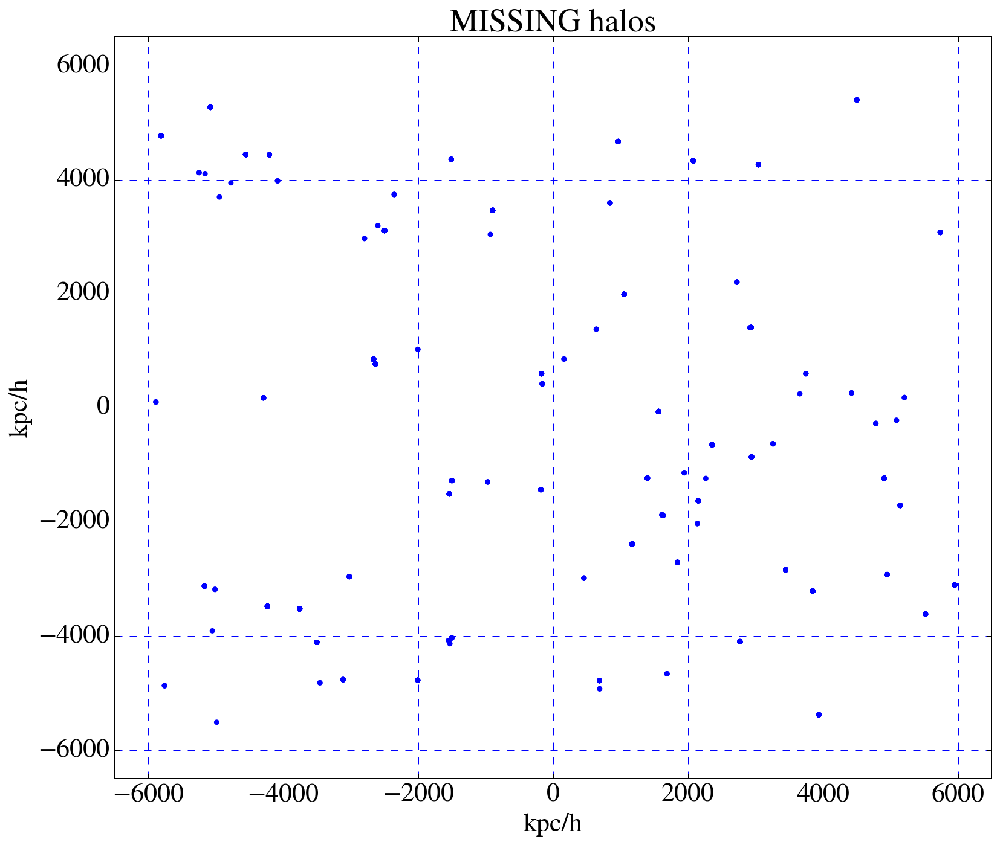

In [115]:
distance = 15.0 #kpc
stars = locs * 1000.0
masses = mass
print(len(stars))
for aHalo in halosPos*1000:
    centrd    = stars - aHalo
    dists     = np.linalg.norm(centrd,axis=1)
    stars = stars[dists > distance] # Keep stars not in this halo
    masses = masses[dists > distance] # Keep star masses not in this halo
print(len(stars))

plt.scatter(stars[:,0],stars[:,1],s=20,c='b', edgecolors='none') # Plot star particles
plt.xlabel('kpc/h')
plt.ylabel('kpc/h')
plt.grid(b=True, which='major', color='b', linestyle='--')
plt.xlim([-6500,6500])
plt.ylim([-6500,6500])
plt.title('MISSING halos')
print("Total mass in stars {}".format(np.sum(masses)))

In [116]:
len(stars)

1193

65682
1193
Halo  0 has  26 sps and mass 1.115e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1167
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1104


Halo  1 has  63 sps and mass 2.489e+05 solMass
Halo  2 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1103
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1100


Halo  3 has   3 sps and mass 1.238e+04 solMass
Halo  4 has   8 sps and mass 3.302e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1092
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1063


Halo  5 has  29 sps and mass 1.226e+05 solMass
Halo  6 has   8 sps and mass 3.302e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1055
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1053


Halo  7 has   2 sps and mass 8.256e+03 solMass
Halo  8 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1052
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1047


Halo  9 has   5 sps and mass 2.064e+04 solMass
Halo 10 has   6 sps and mass 2.477e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1041


Halo 11 has   4 sps and mass 1.651e+04 solMass
Halo 12 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1037
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 1036


Halo 13 has  46 sps and mass 1.858e+05 solMass
Halo 14 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 990
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 988


Halo 15 has  17 sps and mass 7.430e+04 solMass
Halo 16 has  24 sps and mass 1.028e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 971
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 947


Halo 17 has   4 sps and mass 1.651e+04 solMass
Halo 18 has  16 sps and mass 7.017e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 943
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 927


Halo 19 has  36 sps and mass 1.375e+05 solMass
Halo 20 has  36 sps and mass 1.486e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 891
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 855


Halo 21 has   2 sps and mass 8.256e+03 solMass
Halo 22 has  10 sps and mass 4.128e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 853
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 843


Halo 23 has   9 sps and mass 3.715e+04 solMass
Halo 24 has   3 sps and mass 1.238e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 834
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 831


Halo 25 has  11 sps and mass 4.541e+04 solMass
Halo 26 has  48 sps and mass 1.932e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 820
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 772


Halo 27 has   1 sps and mass 4.128e+03 solMass
Halo 28 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 771
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 770


Halo 29 has   2 sps and mass 8.256e+03 solMass
Halo 30 has  17 sps and mass 7.430e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 768
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 751


Halo 31 has  30 sps and mass 1.263e+05 solMass
Halo 32 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 721
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 720


Halo 33 has   2 sps and mass 8.256e+03 solMass
Halo 34 has   8 sps and mass 3.302e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 718
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 710


Halo 35 has   2 sps and mass 8.256e+03 solMass
Halo 36 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 708
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 707


Halo 37 has  45 sps and mass 1.820e+05 solMass
Halo 38 has  48 sps and mass 1.932e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 662
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 614


Halo 39 has   3 sps and mass 1.238e+04 solMass
Halo 40 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 611
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 610


Halo 41 has   7 sps and mass 2.889e+04 solMass
Halo 42 has  54 sps and mass 2.155e+05 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 603
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 549


Halo 43 has  24 sps and mass 1.032e+05 solMass
Halo 44 has  22 sps and mass 9.494e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 525
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 503


Halo 45 has   1 sps and mass 4.128e+03 solMass
Halo 46 has   5 sps and mass 2.064e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 502
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 497


Halo 47 has   1 sps and mass 4.128e+03 solMass
Halo 48 has   4 sps and mass 1.651e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 496
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 492


Halo 49 has   7 sps and mass 2.889e+04 solMass
Halo 50 has   8 sps and mass 3.302e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 485
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 477


Halo 51 has   7 sps and mass 2.889e+04 solMass
Halo 52 has   7 sps and mass 2.889e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 470
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 463


Halo 53 has   8 sps and mass 3.302e+04 solMass
Halo 54 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 455
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 453


Halo 55 has   2 sps and mass 8.256e+03 solMass
Halo 56 has  19 sps and mass 8.256e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 451
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 432


Halo 57 has   3 sps and mass 1.238e+04 solMass
Halo 58 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 429
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 427


Halo 59 has   9 sps and mass 3.715e+04 solMass
Halo 60 has   1 sps and mass 4.128e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 418
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 417


Halo 61 has   5 sps and mass 2.064e+04 solMass
Halo 62 has   9 sps and mass 3.715e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 412
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 403


Halo 63 has   1 sps and mass 4.128e+03 solMass
Halo 64 has   8 sps and mass 3.302e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 402
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 394


Halo 65 has   4 sps and mass 1.651e+04 solMass
Halo 66 has   9 sps and mass 3.715e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 390
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 381


Halo 67 has   3 sps and mass 1.238e+04 solMass
Halo 68 has   3 sps and mass 1.238e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 378
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 375


Halo 69 has  45 sps and mass 1.820e+05 solMass
Halo 70 has  22 sps and mass 9.494e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 330
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 308


Halo 71 has  34 sps and mass 1.412e+05 solMass
Halo 72 has   3 sps and mass 1.238e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 274
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 271


Halo 73 has   4 sps and mass 1.651e+04 solMass
Halo 74 has  16 sps and mass 7.017e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 267
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 251


Halo 75 has  20 sps and mass 8.668e+04 solMass
Halo 76 has  10 sps and mass 4.128e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 231
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 221


Halo 77 has   3 sps and mass 1.238e+04 solMass
Halo 78 has   2 sps and mass 8.256e+03 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 218
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 216
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 210


Halo 79 has   6 sps and mass 2.477e+04 solMass
Halo 80 has  19 sps and mass 8.256e+04 solMass


/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 191
/Users/earnric/.conda/envs/py3k/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 1193 but corresponding boolean dimension is 161


Halo 81 has  30 sps and mass 1.263e+05 solMass
Halo 82 has  61 sps and mass 2.415e+05 solMass
100


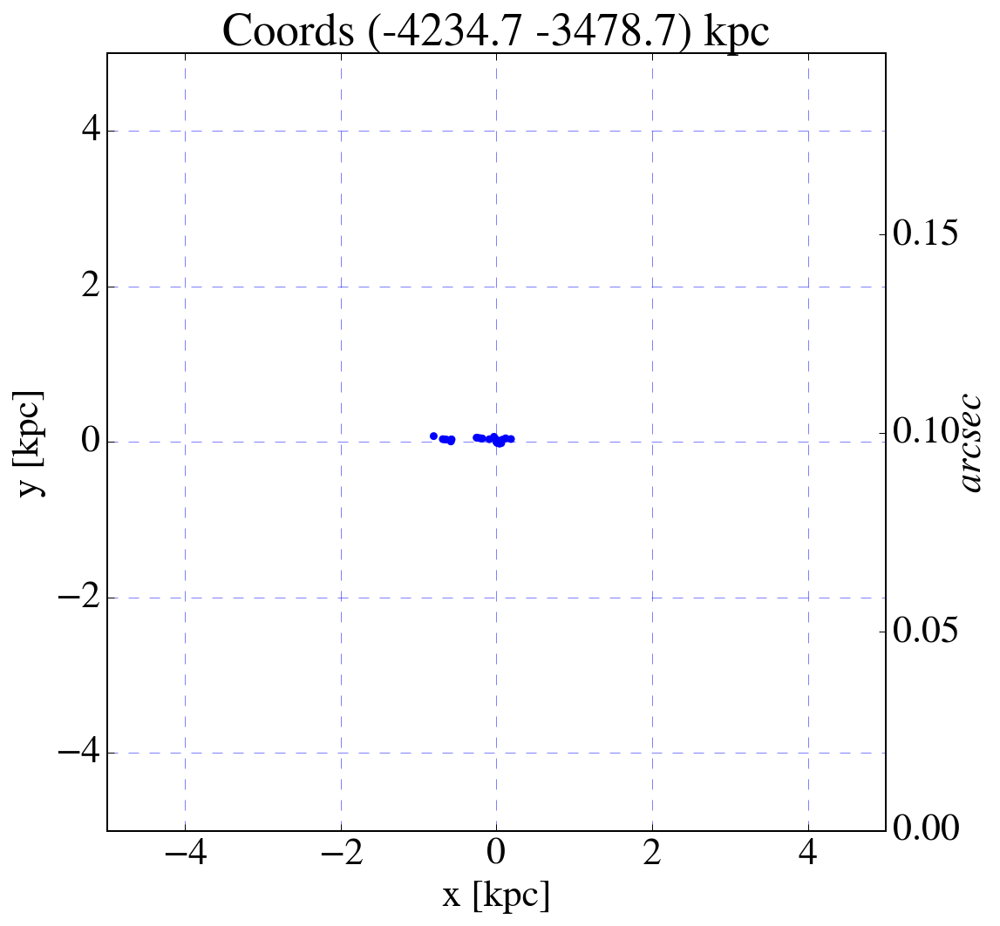

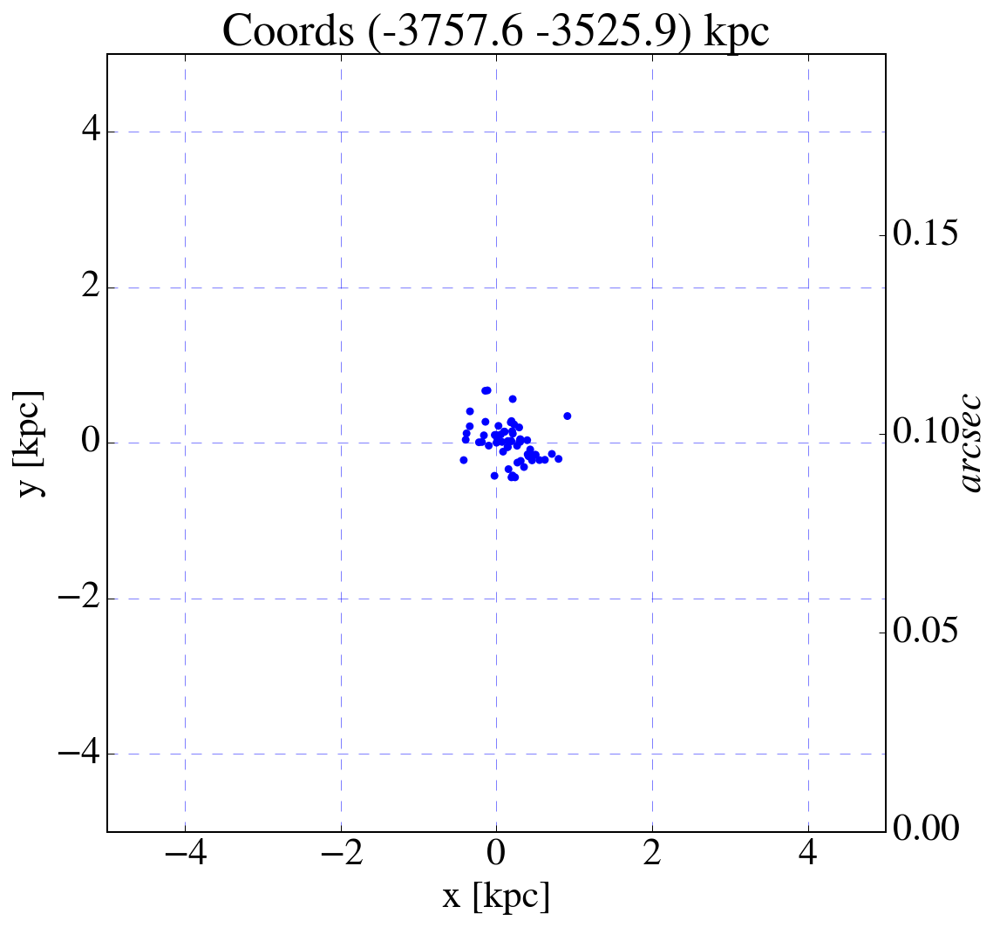

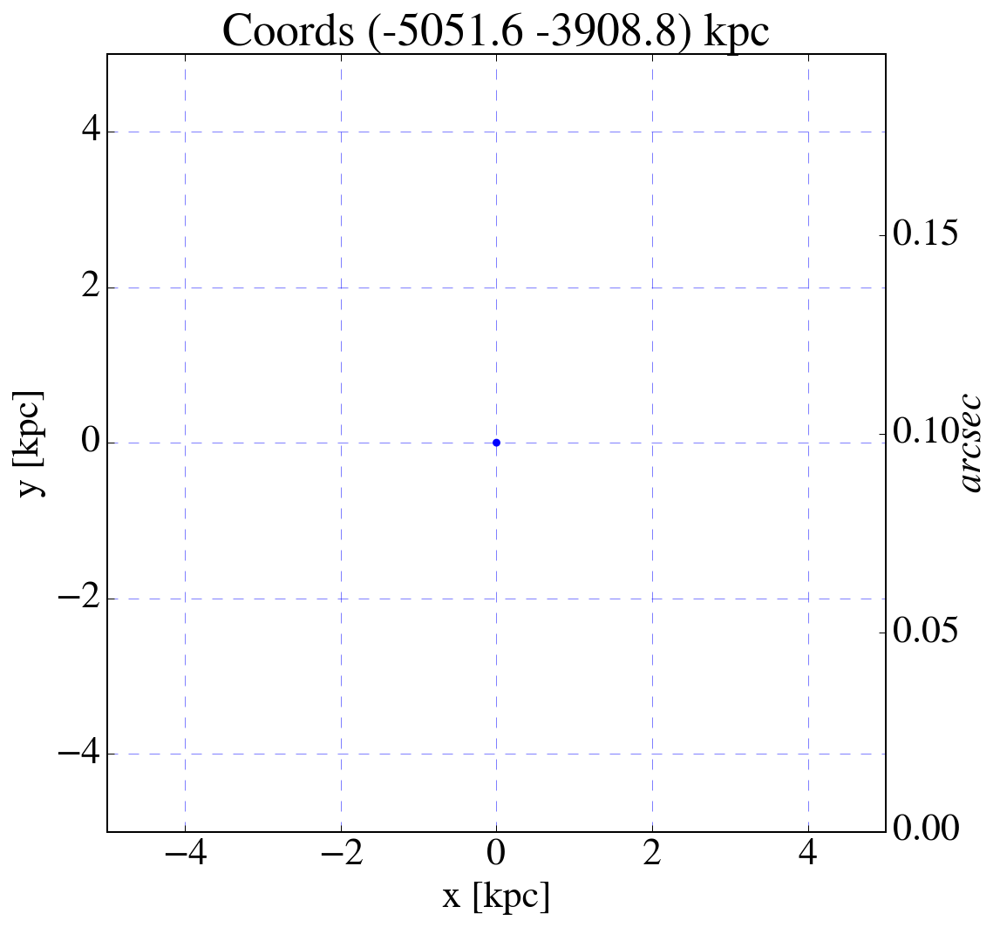

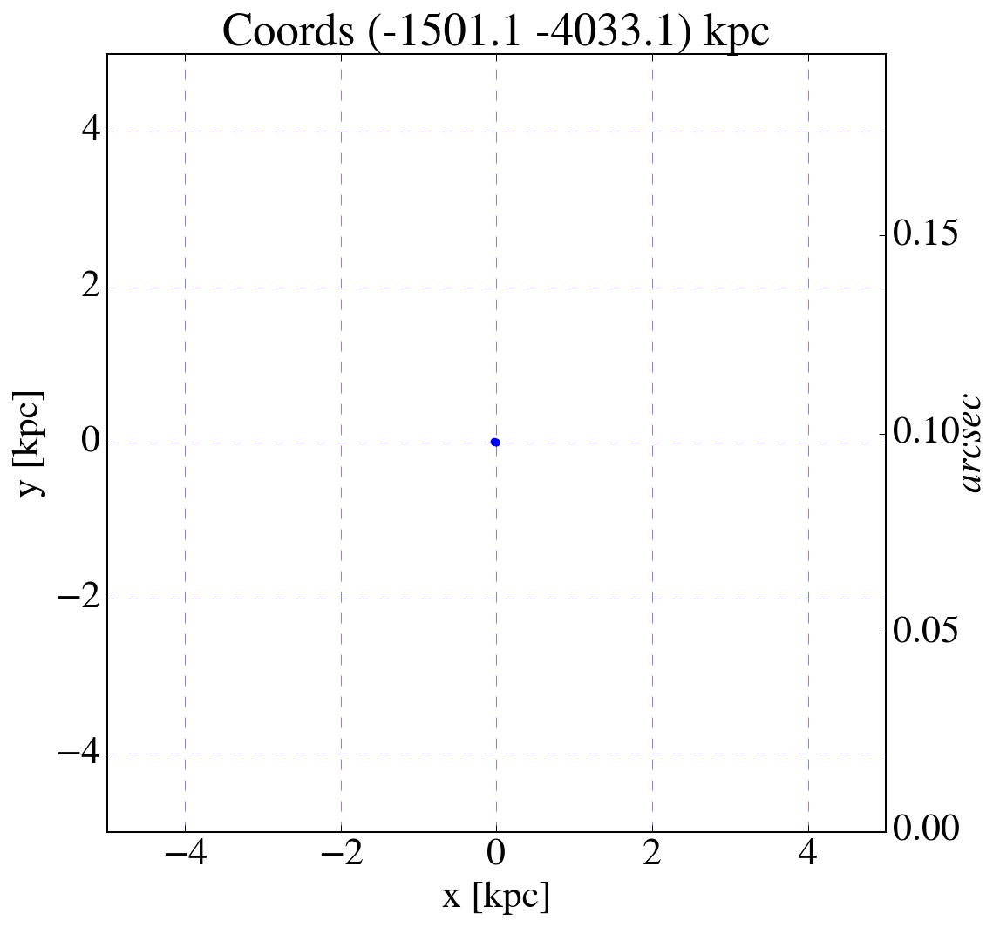

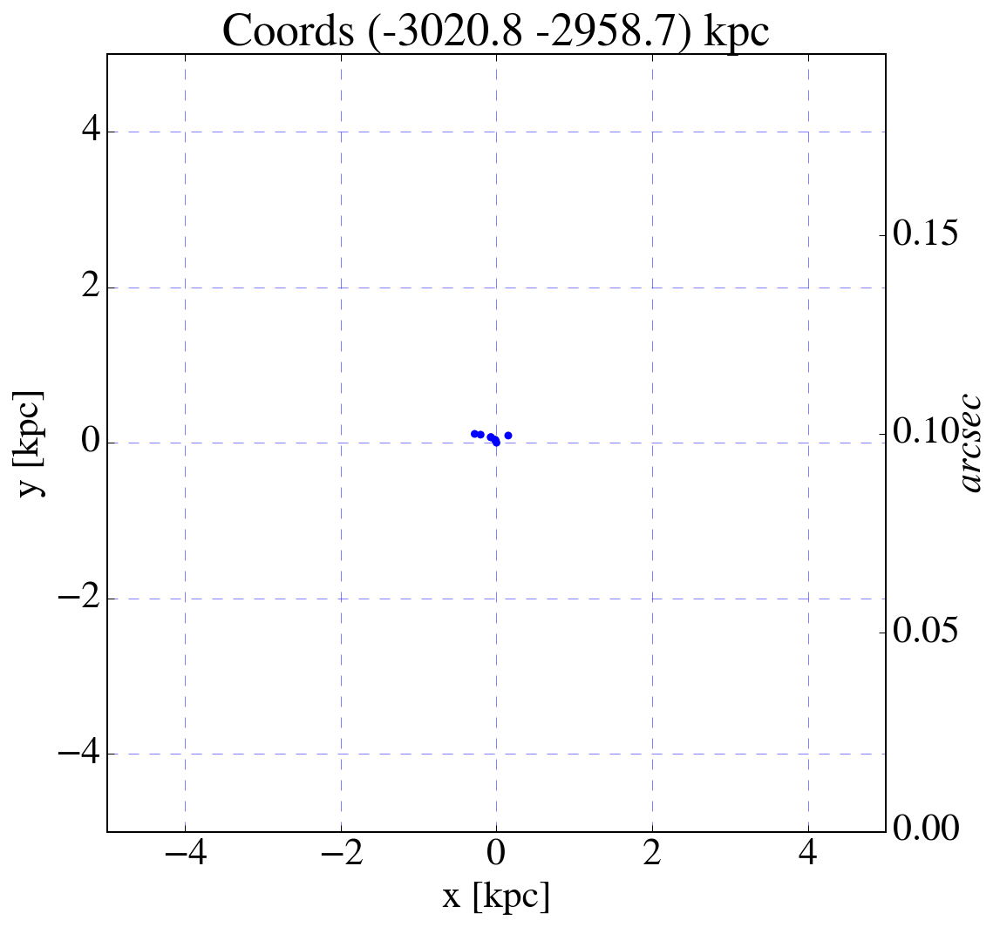

...

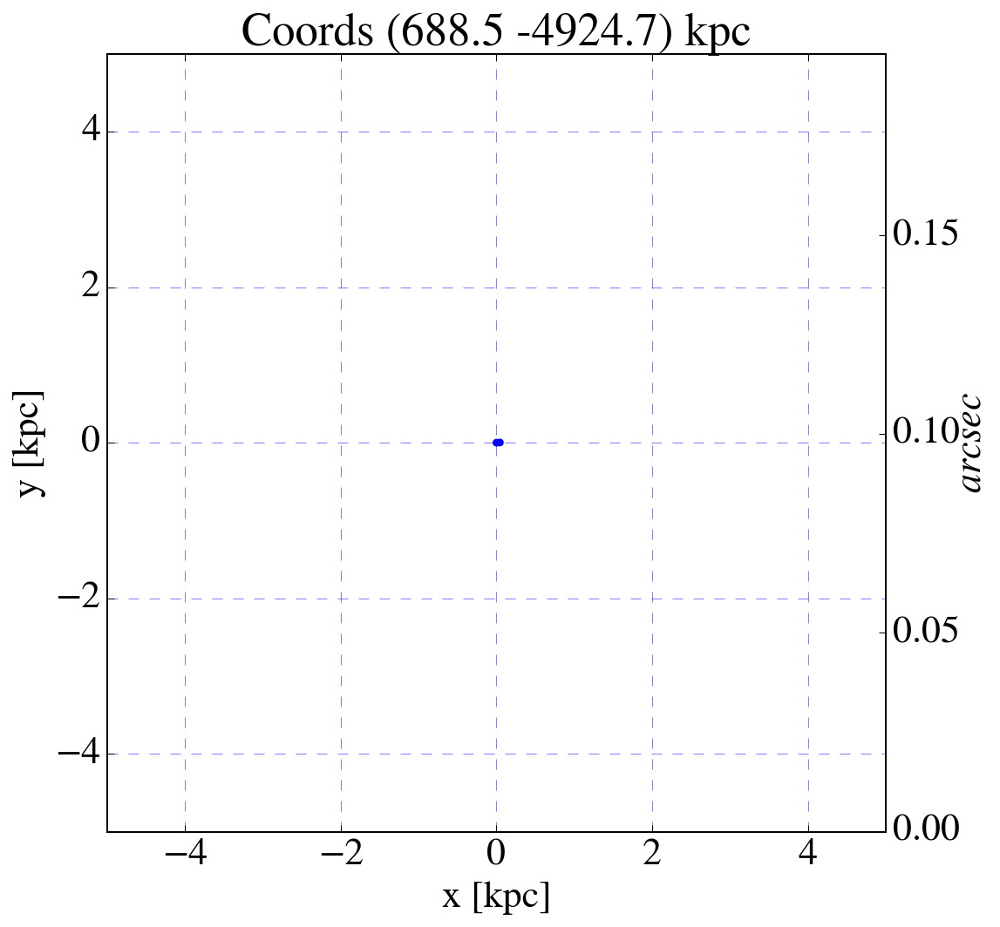

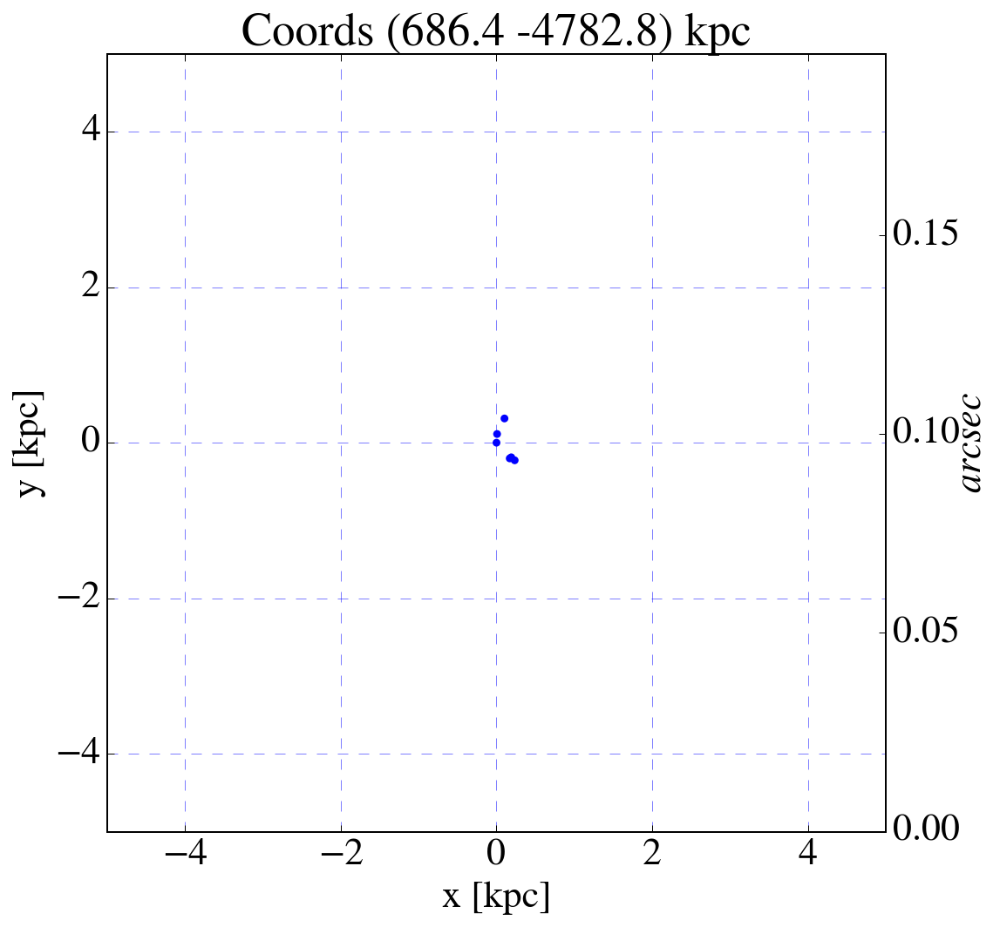

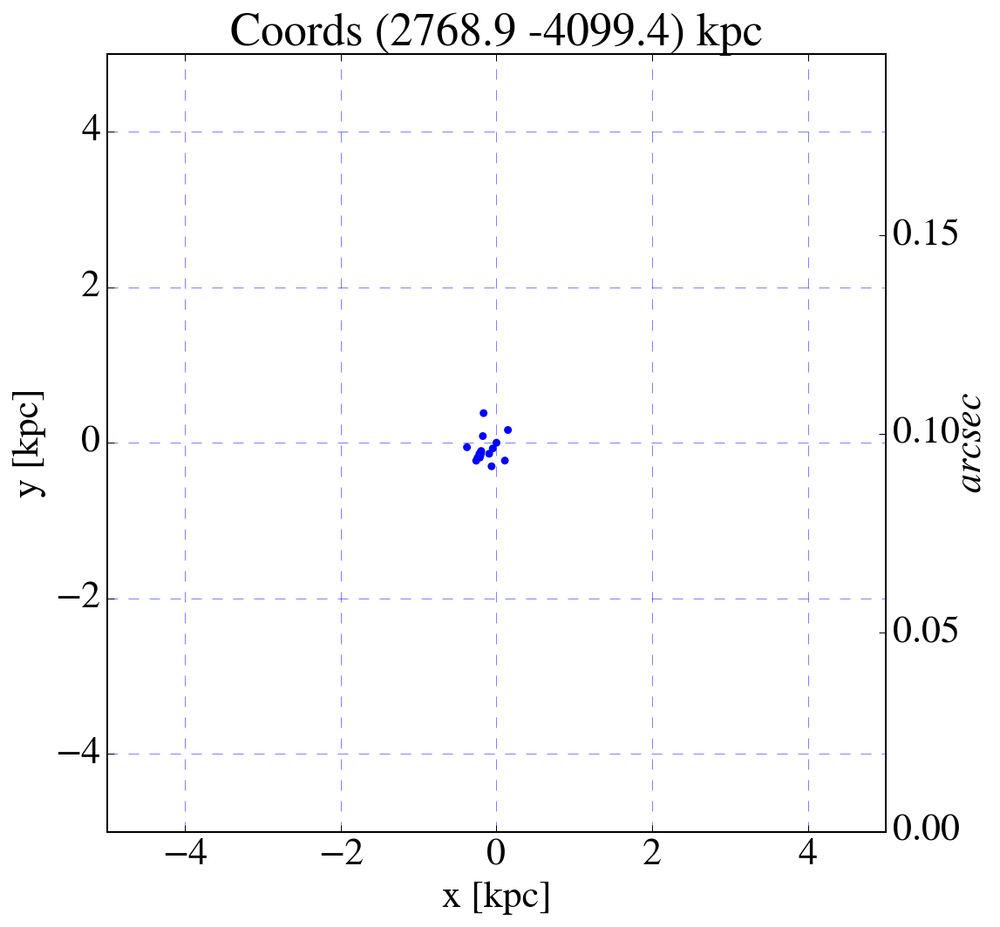

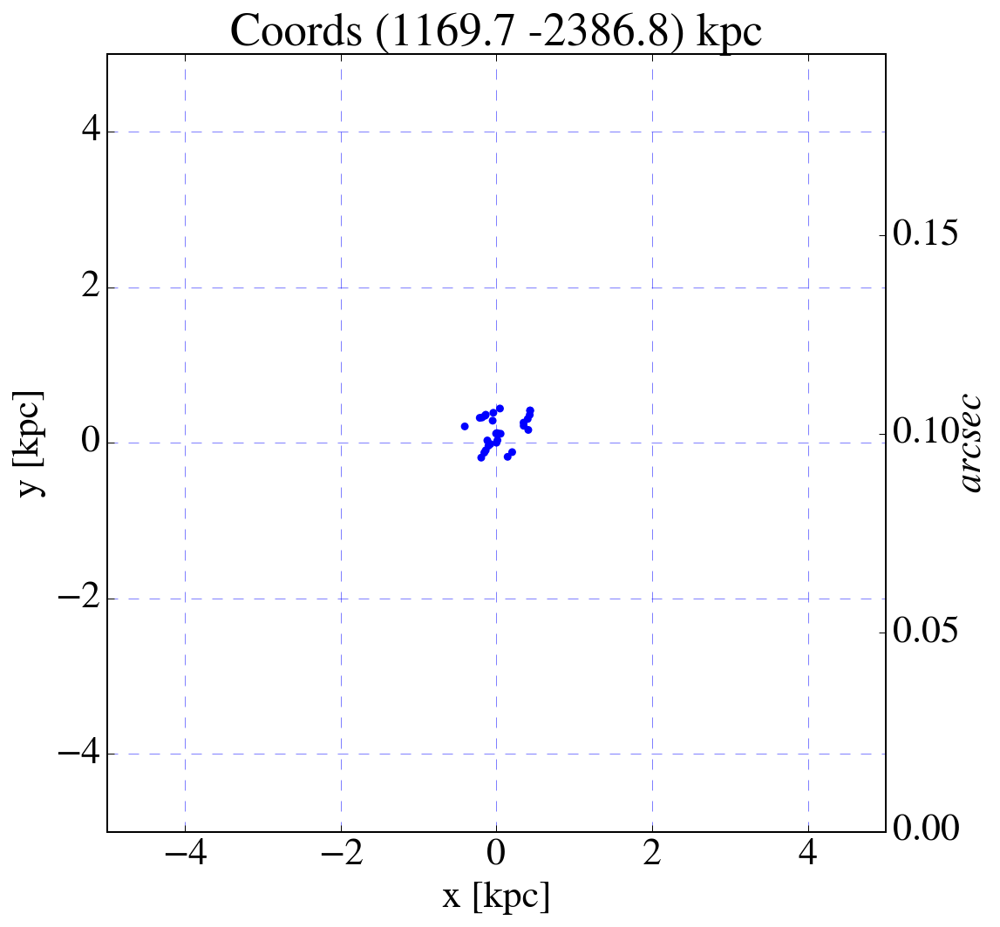

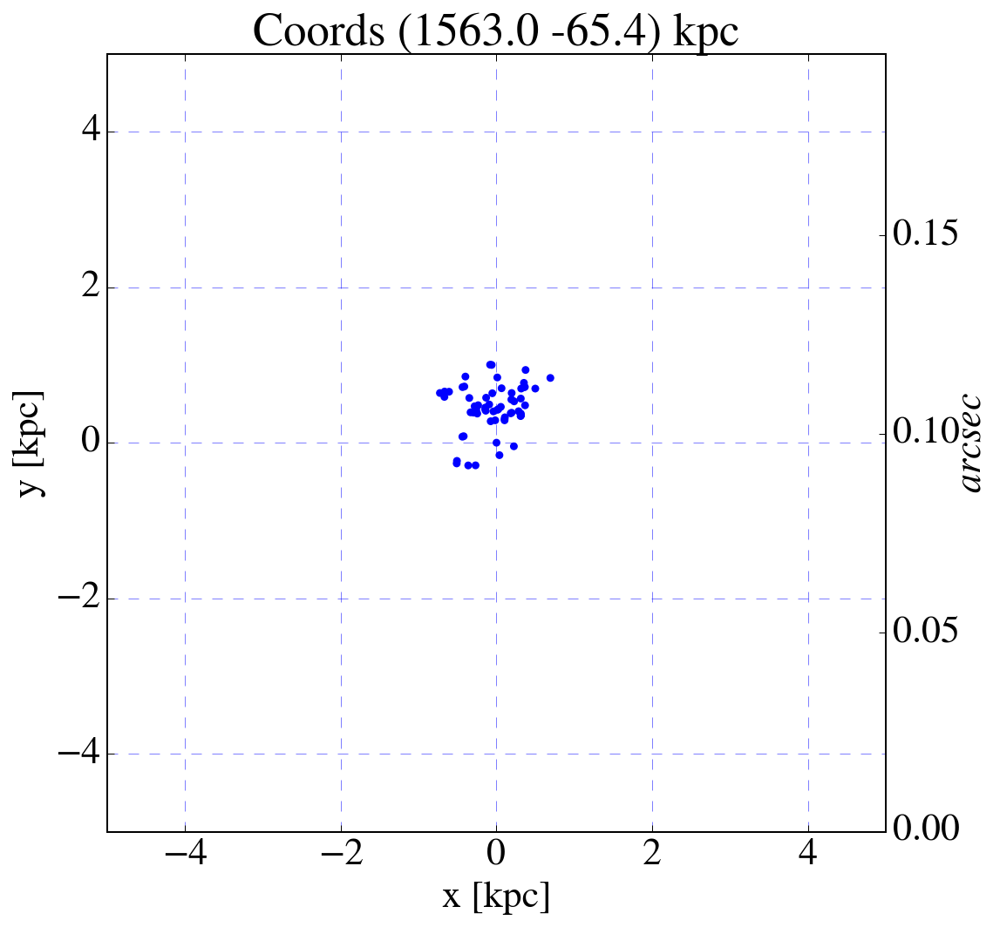

In [117]:
distance = 15.0 #kpc
stars = locs * 1000.0
masses = mass
print(len(stars))
for aHalo in halosPos*1000:
    centrd    = stars - aHalo
    dists     = np.linalg.norm(centrd,axis=1)
    stars = stars[dists > distance] # Keep stars not in this halo
    masses = masses[dists > distance] # Keep star masses not in this halo
print(len(stars))

# Use stars and masses from above!
rad = 5
i = 0
while len(stars) > 100:
    aStar = stars[0]
    centrd     = stars - aStar # Distances between aStar and all others... 
    dists      = np.linalg.norm(centrd,axis=1)
    haloStars  = centrd[dists <= rad] # Get nearby stars locations normalized to 'aStar'...
    haloMasses = masses[dists <= rad] # Get masses
    plotOne(haloStars,haloMasses,rad,aStar[0],aStar[1])
    stars      = stars[dists > rad]  # Keep only stars outside distance
    print("Halo {:2d} has {:3d} sps and mass {:.3e}".format(i,len(haloStars),np.sum(haloMasses) * u.solMass))
    i += 1
    gc.collect()
    
print(len(stars))